# [Retag most popular Leetcode problems](https://gist.github.com/Windsooon/e663358a6be45a93af2665206c4d4ae9)

[Data structure and algorithm](https://docs.google.com/spreadsheets/d/1E4mOYC4P-hoprsXEZdVnwitRvp3dUg-6T5lIulN1gvo/edit#gid=0)

[Github leetcode summary](https://github.com/whocaresustc/Leetcode-Summary)

[common bugs](https://docs.google.com/document/d/1Bvye3Dj7FIEA29s2tDvROS8Ss-KYJcD6zd86P76r9pQ/edit)

#[Leetcode solutions - back to back swe](https://www.youtube.com/results?search_query=back+to+back+swe)
#[Leetcode solutions - basketwangCoding](https://www.youtube.com/channel/UCE35PnPX7EZi8nHSegjMn6Q)

[花花酱 LeetCode 题目分类](https://docs.google.com/spreadsheets/d/1SbpY-04Cz8EWw3A_LBUmDEXKUMO31DBjfeMoA0dlfIA/edit#gid=126913158)

[Leetcode 题解 - 目录.md](https://github.com/CyC2018/CS-Notes/blob/master/notes/Leetcode%20%E9%A2%98%E8%A7%A3%20-%20%E7%9B%AE%E5%BD%95.md)

# [Data Structures — A Quick Comparison](https://medium.com/omarelgabrys-blog/data-structures-a-quick-comparison-6689d725b3b0)

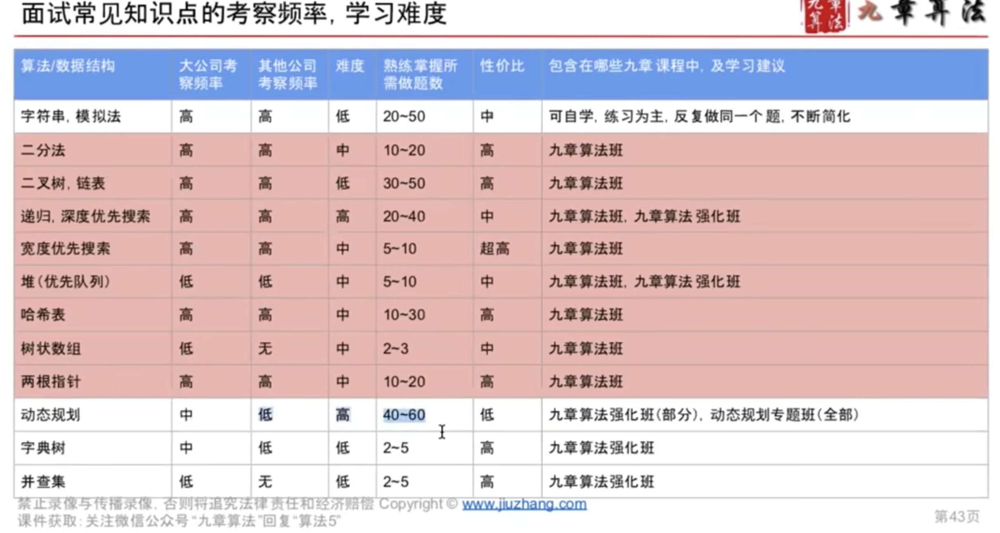

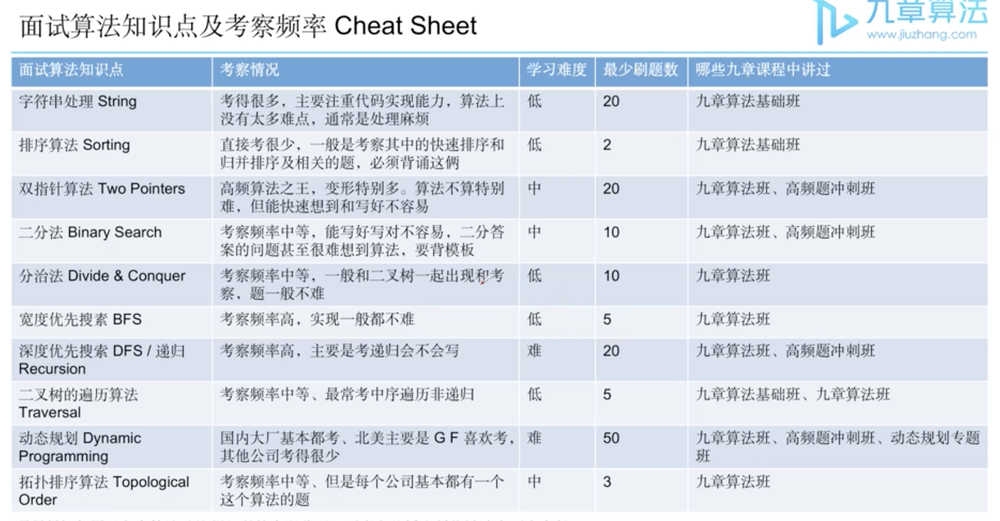



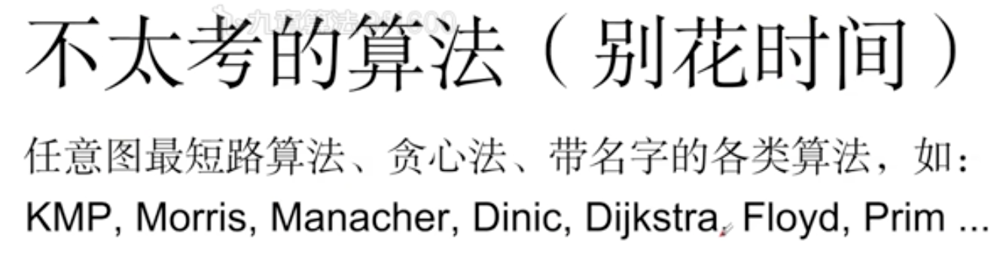

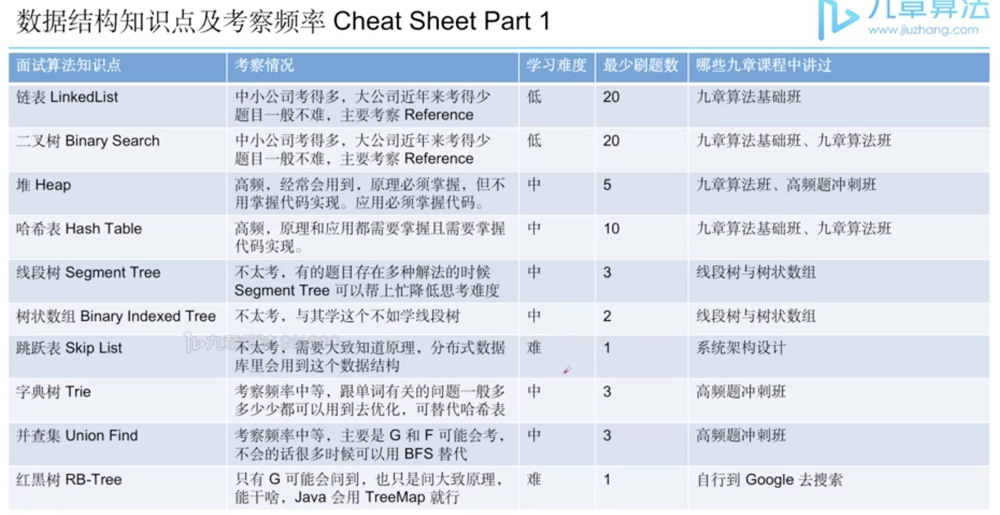

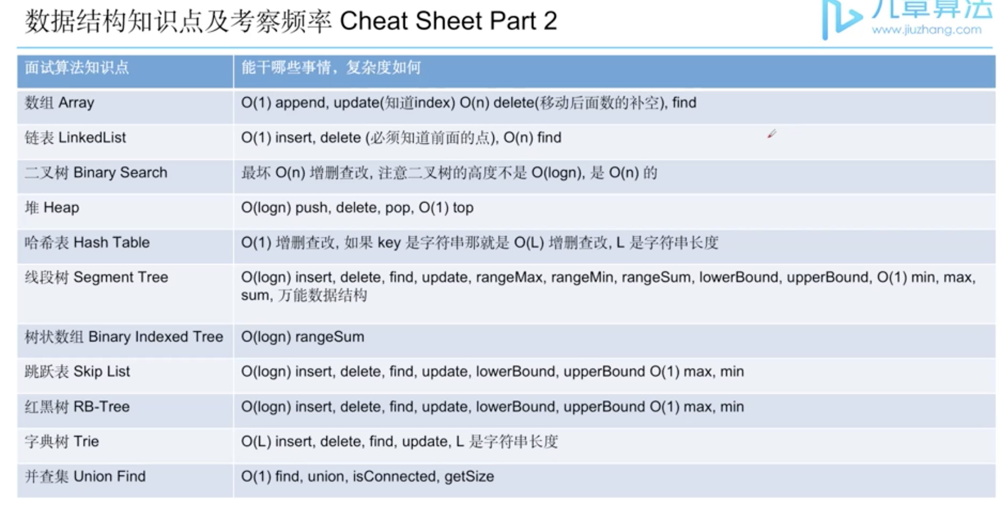

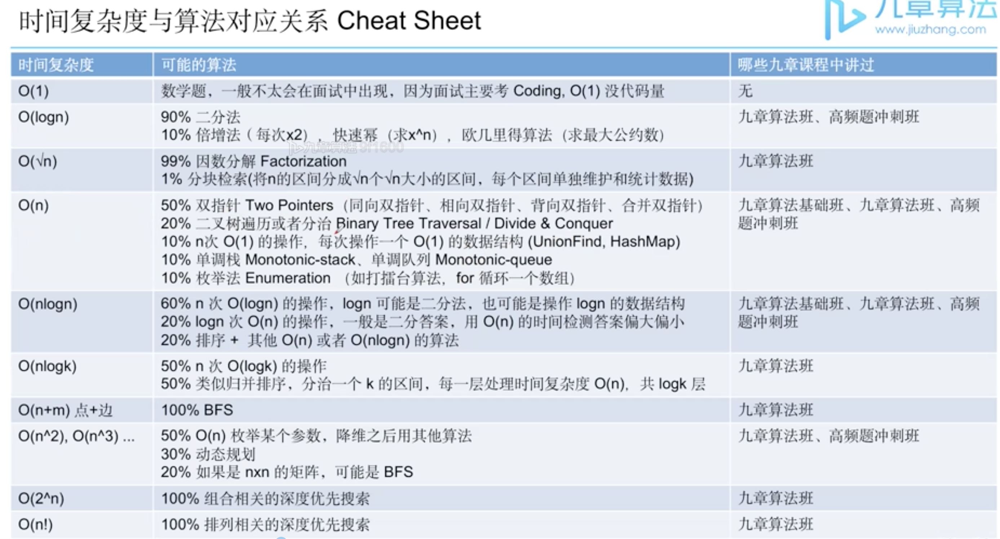

# Pattern 1 Sliding window

[More sliding window problems](https://leetcode.com/problems/subarrays-with-k-different-integers/discuss/523136/JavaC%2B%2BPython-Sliding-Window)



### 28. Impletment strStr()

In [ ]:
# O(L(N-L)) O(1) N: len(haystack) L: len(needle)
class Solution:
    def strStr(self, source, target):
        # Write your code here
        if len(target) == 0:
            return 0
        
        if len(target) > len(source): # avoid this case go to the for loop
            return -1
            
        for i in range(len(source) - len(target) + 1):
            if source[i:len(target)+i] == target:
                return i         
        return -1  

#  Method 2: two pointers  time: best O(N) worst O(L(N-L))
"""Drawback of the previous algorithm is that one compares absolutely all substrings of length L with the needle. 
There is no need to that.

First, let's compare only substrings which starts from the first character in the needle substring. 
Second, let's compare the characters one by one and stop immediately in the case of mismatch.""" 

class Solution:
    def strStr(self, haystack: str, needle: str) -> int:
        if not needle:
            return 0
        
        if len(needle) > len(haystack):
            return -1
        
        p_needle = 0
        p_haystack = 0
        
        for p_haystack in range(len(haystack) - len(needle) + 1):
            if haystack[p_haystack] == needle[p_needle]:
                if self.start_comparision(haystack, needle, p_haystack, p_needle):
                    return p_haystack
                else:
                    p_needle = 0
        return -1
    
    def start_comparision(self, haystack, needle, p_haystack, p_needle):
        L = len(needle)
        while p_needle < L and haystack[p_haystack] == needle[p_needle]:
            p_haystack += 1
            p_needle += 1
        return True if p_needle == len(needle) else False


# Method 3: sliding window + hashing
"""The idea is simple: move along the string, generate hash of substring in the sliding window and compare it with the reference hash of the needle string."""


### 340. Longest Substring with At Most K Distinct Characters

In [ ]:
# sliding window : O(n) O(k)
class Solution(object):
    def lengthOfLongestSubstringKDistinct(self, s, k):
        if not s:
            return 0
        
        start = 0
        visited = {}
        ans = 0
        for end in range(len(s)):
            visited[s[end]] = visited.get(s[end],0) + 1
            while start <= end and len(visited) > k:
                visited[s[start]] -= 1
                if visited[s[start]] == 0:
                    del visited[s[start]]
                start += 1 
                
            # ans keeps updating for those <= k solutions
            ans = max(ans, end - start + 1) # include the case:  len(set(s)) <= k
        return ans

### 1297. Maximum Number of Occurrences of a Substring

In [ ]:
# sliding window

"""If a string have occurrences x times,
any of its substring must appear at least x times.

There must be a substring of length minSize, that has the most occurrences.
So that we just need to count the occurrences of all substring with length minSize.
"""

# Similar to problem 159. Longest Substring with At Most Two Distinct Characters
# The difference is that this problem is a fixed window, when move right pointer, left pointer has to be updated
# While 159 is not a fixed-window, right pointer will keep move until doesn't satisfy condition and then move the left pointer


from collections import Counter

class Solution:
    def maxFreq(self, s: str, maxLetters: int, minSize: int, maxSize: int) -> int:        
        left = 0
        candidate = Counter(s[:minSize - 1])
        ans = {}
        
        for right in range(minSize - 1, len(s)):
            char = s[right]
            candidate[char] += 1
            
            if len(candidate.keys()) <= maxLetters: # meet the condition, update result
                ans[s[left:right+1]] = ans.get(s[left:right+1], 0) + 1
                
            # update left
            candidate[s[left]] -= 1 # s[left] not left 
            if candidate[s[left]] == 0:
                del candidate[s[left]]
            left += 1
                               
        return max(ans.values()) if ans else 0 # for example 4 case
    

class Solution:
    def maxFreq(self, s: str, maxLetters: int, minSize: int, maxSize: int) -> int:        
        left = 0
        ans = {}
        candidate = {}
        
        for right in range(len(s)):
            char = s[right]
            candidate[char] = candidate.get(char, 0) + 1
            
            if right >= minSize - 1: # only when meet the minimum size window      
                
                if len(candidate.keys()) <= maxLetters:
                    ans[s[left:right+1]] = ans.get(s[left:right+1], 0) + 1

                # update left
                candidate[s[left]] -= 1 # s[left] not left 
                if candidate[s[left]] == 0:
                    del candidate[s[left]]
                left += 1
                               
        return max(ans.values()) if ans else 0 # for example 4 case

### 3. Longest Substring Without Repeating Characters

In [ ]:
# O(n) O(n)
class Solution(object):
        def lengthOfLongestSubstring(self, s):
            """
            :type s: str
            :rtype: int
            """
            used = {} # last index of each character
            max_length = left = 0
            for right, c in enumerate(s):
                if c in used and left <= used[c]: # for the case "tmmzuxt" that left pointer already passes the first "t"
                    left = used[c] + 1
                else:
                    max_length = max(max_length, right - left + 1)

                used[c] = right

            return max_length

### 209. Minimum Size Subarray Sum

In [ ]:
# O(N) O(1)
class Solution:
    def minSubArrayLen(self, s: int, A: List[int]) -> int:        
        left, res = 0, float("inf")
        cur_sum = 0
        
        for right in range(len(A)):
            cur_sum += A[right]
            
            while cur_sum >= s:
                res = min(res, right - left + 1)
                cur_sum -= A[left]
                left += 1
                
        return res if res != float("inf") else 0

### 862. Shortest Subarray with Sum at Least K ( the difference with 209 is that the number could be negative)

In [ ]:
# prefix sum: no limitation of K > 0
import heapq

class Solution:
    def shortestSubarray(self, A: List[int], K: int) -> int:
        q = [(0, -1)]
        cum = 0
        res = float('inf')
        for i, x in enumerate(A):
            cum += x
            
            while q and cum - q[0][0] >= K: # if satisfy condition popout all the solutions(smallest first) ending with current i
                res = min(res, i - heapq.heappop(q)[1])
                
            heapq.heappush(q, (cum, i))
        return res if res < float('inf') else -1
    
# mono increasing stack because K > 0    
     def shortestSubarray(self, A, K):
        d = collections.deque([[0, 0]])
        res, cur = float('inf'), 0
        for i, a in enumerate(A):
            cur += a
            while d and cur - d[0][1] >= K:
                res = min(res, i + 1 - d.popleft()[0])
            while d and cur <= d[-1][1]:
                d.pop()
            d.append([i + 1, cur])
        return res if res < float('inf') else -1

    
def shortestSubarray(self, A, K):
        d = collections.deque([[0, 0]])
        res, cur = float('inf'), 0
        for i, a in enumerate(A):
            cur += a
            while d and cur - d[0][1] >= K:
                res = min(res, i + 1 - d.popleft()[0])
            while d and cur <= d[-1][1]:
                d.pop()
            d.append([i + 1, cur])
        return res if res < float('inf') else -1

### 438. Find All Anagrams in a String

In [ ]:
# Here is a pertumation while 28 Implement strstr is a exact match

from collections import Counter
class Solution:
    def findAnagrams(self, s: str, p: str) -> List[int]:
        L = 0
        ans = []
        
        Counter_p = Counter(p)
        Counter_s = Counter()
               
        for R in range(len(s)):
            Counter_s[s[R]] += 1
            
            if R >= len(p) - 1:
                if Counter_s == Counter_p:
                    ans.append(L)
                    
                # Update left
                Counter_s[s[L]] -= 1
                if Counter_s[s[L]] == 0:
                    del Counter_s[s[L]]
                L += 1
                
        return ans

### 76. Minimum Window Substring

In [ ]:
from collections import Counter
class Solution:
    def minWindow(self, s: str, t: str) -> str:
        if not t or not s:
            return ""
        
        target = Counter(t)
        left = 0
        res = ""
        matched = 0
        minlength = float("inf")
        for right in range(len(s)):           
            if s[right] in target:
                target[s[right]] -= 1 # negative meaning extra characters in t
                if target[s[right]] == 0:
                    matched += 1
                    
            # update result
            while left <= right and matched == len(target):  # <= not < for case "a" "a"          
                if right - left < minlength:
                    minlength = right - left
                    res = s[left:right+1]   
                    
                # update left
                if s[left] in target:
                    target[s[left]] += 1 
                    if target[s[left]] > 0: 
                        matched -= 1     
                left += 1 # no matter s[left] in or not in target, always move it
        return res
    


# O(len(s) + len(t))   O(len(t))
# Check 3. Longest Substring Without Repeating Characters
from collections import Counter

class Solution:
    def minWindow(self, s: str, t: str) -> str:
        if not t or not s:
            return ""

        target = Counter(t)
        right = 0
        res = ""
        matched = 0
        minlength = float("inf")
        for left in range(len(s) - len(t) + 1):
            # Move right until find a solution or reach the end
            while right < len(s) and matched < len(target):
                if s[right] in target:
                    target[s[right]] -= 1  # negative meaning extra characters in t
                    if target[s[right]] == 0:
                        matched += 1
                right += 1  # right move one more position than the matched substring

            # update result
            if matched == len(target):
                if right - left < minlength:
                    minlength = right - left
                    res = s[left:right]

            # update left
            if s[left] in target:
                target[s[left]] += 1  # target is dynamic if left is excluded, then target is updated to reflect the change
                if target[s[left]] > 0:
                    matched -= 1

        return res

### 727. Minimum Window Subsequence

In [4]:
# DFS + memo

class Solution:
    def minWindow(self, S: str, T: str) -> str:
        def dfs(i, j): # the minimum substring for S[i:] and T[j:]
            
            if j == len(T): # find the satisfied substring
                return i
            
            if (i, j) not in memo:
                ind = S.find(T[j], i + 1)              
                memo[(i, j)] = float('inf') if ind == -1 else dfs(ind, j + 1)
                
            return memo[(i, j)]
            
        l, res, memo = float('inf'), '', {}
        
        for i, s in enumerate(S):
            if s == T[0]: # find the first match
                j = dfs(i, 1)
                
                if j - i < l:# update
                    l, res = j - i, S[i:j + 1]
        return res
    
# Sliding windown solution: https://leetcode.com/problems/minimum-window-subsequence/discuss/512645/Easy-To-Understand-%3A-Sliding-window-2-pointer-Find-then-Improve 


### 992. Subarrays with K Different Integers

In [ ]:
#https://leetcode.com/problems/subarrays-with-k-different-integers/discuss/235002/One-code-template-to-solve-all-of-these-problems!  

class Solution(object):
    def subarraysWithKDistinct(self, s: List[int], k: int) -> int:
        """
        :type s: str
        :type k: int
        :rtype: int
        """
        # Convert into sub arrays with at most k distinct characters
        return self.subarraysWithAtMostKDistinct(s, k) - self.subarraysWithAtMostKDistinct(s, k-1)
    
    def subarraysWithAtMostKDistinct(self, s, k):
        if not s:
            return 0
        start = 0
        visited = {}
        ans = 0
        for end in range(len(s)):
            visited[s[end]] = visited.get(s[end], 0) + 1 
            
            while start <= end and len(visited) > k:
                visited[s[start]] -= 1
                if visited[s[start]] == 0:
                    del visited[s[start]]
                start += 1
                
            ans += end - start # ending in end: how many solutions
                
        return ans 

### 1248. Count Number of Nice Subarrays

In [ ]:
# Same template as LC992
# O(N) O(1)
class Solution:
    def numberOfSubarrays(self, s: List[int], k: int) -> int:

        # Convert into sub arrays with at most k distinct characters
        return self.subarraysWithAtMostKDistinct(s, k) - self.subarraysWithAtMostKDistinct(s, k-1)
    
    def subarraysWithAtMostKDistinct(self, s, k):
        if not s:
            return 0
        start = 0
        count = 0
        ans = 0
        for end in range(len(s)):
            if s[end] % 2 == 1:
                count += 1
                   
            while start <= end and count > k:
                if s[start] % 2 == 1:
                    count -= 1
                start += 1            
            ans += end - start # ending in end: how many solutions
                
        return ans 

### 239. Sliding Window Maximum

In [ ]:
# O(N) O(k)
from collections import deque
class Solution:
    def maxSlidingWindow(self, nums: List[int], k: int) -> List[int]:
        ans = []
        queue = deque()
        n = len(nums)
        
        for i in range(n):
            # building the descending order queue
            while queue and nums[i]>nums[queue[-1]]:
                queue.pop()
            queue.append(i)
            
            # update result
            if i >= k - 1:
                ans.append(nums[queue[0]])
                
                # update left if needed
                if queue[0] == i - k + 1: # the reason queue needs to store index instead of num itself
                    queue.popleft()
        return ans

### 1438. Longest Continuous Subarray With Absolute Diff Less Than or Equal to Limit

In [ ]:
# O(N) O(N)
from collections import deque
class Solution:
    def longestSubarray(self, nums: List[int], limit: int) -> int:
        descending_queue = deque()
        ascending_queue = deque()
        longest = 0
        left = 0
        
        for right, num in enumerate(nums):
            while descending_queue and num > descending_queue[-1]:
                descending_queue.pop()
            descending_queue.append(num)
            while ascending_queue and num < ascending_queue[-1]:
                ascending_queue.pop()
            ascending_queue.append(num)
            
            while descending_queue[0] - ascending_queue[0] > limit:
                if descending_queue[0] == nums[left]:
                    descending_queue.popleft()
                if ascending_queue[0] == nums[left]:
                    ascending_queue.popleft()
                left += 1
                
            longest = max(longest, right - left + 1)
            
        return longest

# Pattern 2 Two pointers

### 11. Container With Most Water

In [ ]:
# O(n) O(1)
class Solution(object):
    def maxArea(self, height):
        left = 0
        right = len(height) - 1
        max_area = (right - left) * min(height[left], height[right])
        while (left < right):
            if height[left] < height[right]:
                left += 1
            else:
                right -= 1
            max_area = max(max_area, (right - left) * min(height[left],height[right]))
        
        return max_area

### 42 Trapping rain water

In [ ]:
# Two pointers
# O(n) O(1)
class Solution:
    def trap(self, height: List[int]) -> int:
        n = len(height)
        if n <= 2:
            return 0

        left, right = 0, n - 1
        left_max, right_max = height[0], height[n - 1]
        ans = 0
        while left <= right:
            left_max, right_max = max(left_max, height[left]), max(right_max, height[right])
            if left_max < right_max:  # move the smaller side
                ans += left_max - height[left]
                left += 1
            else:
                ans += right_max - height[right]
                right -= 1
        return ans

### 27. Remove Element

In [ ]:
class Solution(object):
    def removeElement(self, nums, val):
        slow = 0       
        for fast in range(len(nums)):
             if nums[fast] != val: # find one that is different with val
                nums[slow] = nums[fast]
                slow += 1
        return slow

### 26. Remove Duplicates from Sorted Array

In [ ]:
class Solution:
    def removeDuplicates(self, nums: List[int]) -> int:
        non_duplicate = 1
        for i in range(1, len(nums)):
            if nums[i] != nums[non_duplicate - 1]: # find one that is not duplicated with previous one            
                nums[non_duplicate] = nums[i]
                non_duplicate += 1
                
        return non_duplicate

### 283. Move Zeroes

In [ ]:
class Solution(object):
    def moveZeroes(self, nums):
        non_zero_pointer = 0
        for i in range(len(nums)):
            if nums[i] != 0:
                nums[non_zero_pointer], nums[i] = nums[i], nums[non_zero_pointer]
                non_zero_pointer += 1

### 80. Remove Duplicates from Sorted Array II

In [ ]:
class Solution(object):
    def removeDuplicates(self, nums):
        tail = 2
        for i in range(2, len(nums)):
            if nums[i] != nums[tail - 2]:# find one that is not more than twice duplicated
                nums[tail] = nums[i]
                tail += 1
        return tail

### 82. Remove Duplicates from Sorted List II

In [ ]:
class Solution:
    def deleteDuplicates(self, head: ListNode) -> ListNode:
        dummy = pre = ListNode(0)
        dummy.next = head
        while head and head.next:
            if head.val == head.next.val:
                while head and head.next and head.val == head.next.val:
                    head = head.next
                head = head.next
                pre.next = head
            else:
                pre = pre.next
                head = head.next
        return dummy.next

### 977. Squares of a Sorted Array

In [ ]:
class Solution:
    def sortedSquares(self, A: List[int]) -> List[int]:
        left, right = 0, len(A) - 1
        ans = []
        while left <= right:
            if A[left]**2 <= A[right]**2:
                ans.append(A[right]**2)
                right -= 1
            else:
                ans.append(A[left]**2)
                left += 1
                
        return ans[::-1]

### 203. Remove Linked List Elements

In [ ]:
class Solution:
    def removeElements(self, head: ListNode, val: int) -> ListNode:
        dummy = prev = ListNode(-1)
        dummy.next = head
        
        cur = head
        
        while cur:
            if cur.val == val:
                prev.next = cur.next
            else:
                prev = cur
            cur = cur.next
        return dummy.next

### 1099. Two Sum Less Than K

In [ ]:
class Solution:
    def twoSumLessThanK(self, A: List[int], K: int) -> int:
        
        A.sort() # Don't use A = A.sort()
        
        max_sum = -1
        start, end = 0, len(A) - 1  # handle the case that len(A) == 1
        while start < end:
            Cur_Sum = A[start] + A[end]
            if Cur_Sum >= K:
                end -= 1
            else:
                max_sum = max(max_sum, Cur_Sum)
                start += 1
                
        return max_sum

### 15. 3Sum

In [ ]:
#Two pointers time: O(nlgn + n**2)  space: O(lgn ~ n) depending on the sorting algorithm
class Solution:
    def threeSum(self, nums: List[int]) -> List[List[int]]:
        nums.sort()
        res = []
        for i in range(len(nums) - 2):
            if nums[i] > 0: # after sorting the smallest must be smaller than 0
                break
            if i > 0 and nums[i] == nums[i - 1]:# avoid duplicate
                continue
            self.TwoSum(nums, i, -nums[i], res)
        return res
    
    def TwoSum(self, nums, i, target, res):
        left = i + 1
        right = len(nums) - 1
        while left < right:
            cur_sum = nums[left] + nums[right]
            if cur_sum == target:
                res.append([nums[i], nums[left], nums[right]])
                while left < right and nums[right] == nums[right - 1]:
                    right -= 1
                while left < right and nums[left] == nums[left + 1]:
                    left += 1   
                left += 1
                right -= 1
                
            elif cur_sum > target:            
                right -= 1
            else:             
                left += 1
        

### 16. 3Sum Closest

In [ ]:
# O(n**2) O(1)
class Solution:
    def threeSumClosest(self, nums: List[int], target: int) -> int:
        diff = float('inf')
        nums.sort()
        for i in range(len(nums)):
            lo, hi = i + 1, len(nums) - 1
            while (lo < hi):
                sum = nums[i] + nums[lo] + nums[hi]
                if abs(target - sum) < abs(diff):
                    diff = target - sum
                if sum < target:
                    lo += 1
                else:
                    hi -= 1
            if diff == 0:
                break
        return target - diff

### 259. 3Sum Smaller

In [ ]:

# O(n**2) O(lgn ~ n)
class Solution:
    def threeSumSmaller(self, nums: List[int], target: int) -> int:
        nums.sort()
        res = 0
        for i in range(len(nums) - 2):
            res += self.TwoSum(nums, i, target-nums[i])
        return res
    
    def TwoSum(self, nums, i, target_1):
        left = i + 1
        right = len(nums) - 1
        ans = 0
        while left < right:
            cur_sum = nums[left] + nums[right]
            if cur_sum < target_1:
                ans += right - left # not += 1
                left += 1             
            else:            
                right -= 1
        return ans

### 88. Merge Sorted Array

In [ ]:
class Solution:
        def merge(self, nums1, m, nums2, n):
            while m > 0 and n > 0:
                if nums1[m-1] >= nums2[n-1]:
                    nums1[m+n-1] = nums1[m-1]
                    m -= 1
                else:
                    nums1[m+n-1] = nums2[n-1]
                    n -= 1
                    
            if n > 0: # if nums2 is not empty
                nums1[:n] = nums2[:n]

# Pattern 3 Linked List (slow and fast pointer: Hare & Tortoise algorithm)

### Detect a cycle

In [9]:
class Node:
    def __init__(self, value, next = None):
        self.value = value
        self.next = next

    def has_cycle(head):
        slow, fast = head, head
        while fast and fast.next:
            slow = slow.next
            fast = fast.next.next
            if slow == fast:
                return True
        return False   

### Find the length of the cycle

In [ ]:
class Node:
    def __init__(self, value, next = None):
        self.value = value
        self.next = next

    def find_cycle_length(head):
        slow, fast = head, head
        while fast and fast.next:
            slow = slow.next
            fast = fast.next.next
            if slow == fast:
                return calculate_cycle_length(slow, head)
            
    def calculate_cycle_length(slow, head):
        cycle_length = 0
        cur = slow
        while True:
            cur = cur.next
            cycle_length += 1
            if cur == slow:
                return cycle_length
            

### Find cycle start

In [ ]:
def find_cycle_start(head):
    cycle_length = 0
      # find the LinkedList cycle
    slow, fast = head, head
    while (fast is not None and fast.next is not None):
        fast = fast.next.next
        slow = slow.next
        if slow == fast:  # found the cycle
            cycle_length = calculate_cycle_length(slow)
            break
    return find_start(head, cycle_length)


   def calculate_cycle_length(slow, head):
        cycle_length = 0
        cur = slow
        while True:
            cur = cur.next
            cycle_length += 1
            if cur == slow:
                return cycle_length


def find_start(head, cycle_length):
    pointer1 = head
    pointer2 = head
  # move pointer2 ahead 'cycle_length' nodes
    while cycle_length > 0:
        pointer2 = pointer2.next
        cycle_length -= 1
        
  # increment both pointers until they meet at the start of the cycle
    while pointer1 != pointer2:
        pointer1 = pointer1.next
        pointer2 = pointer2.next
    return pointer1


### 202. Happy Number

In [ ]:
class Solution:
    def isHappy(self, n: int) -> bool:
        
        def get_next(n):
            total_sum = 0
            while n > 0:
                n, digit = divmod(n, 10)
                total_sum += digit ** 2
            return total_sum

        seen = set()
        while n != 1 and n not in seen:
            seen.add(n)
            n = get_next(n)

        return n == 1

    
class Solution:
    def isHappy(self, n: int) -> bool:
        
        def get_next(n):
            total_sum = 0
            while n > 0:
                n, digit = divmod(n, 10)
                total_sum += digit ** 2
            return total_sum

        slow, fast = n, n
        while True:
            slow = get_next(slow)
            fast = get_next(get_next(fast))
            if slow == fast: # when fast reach 1 it will be stuck there
                break
                
        return slow == 1

### Middle of a linked list

In [ ]:
def find_middle_of_linked_list(head):
    slow = head
    fast = head
    while fast and fast.next:
        slow = slow.next
        fast = fast.next.next
    return slow

### 206. Reverse linked list

In [ ]:
class Solution:
    def reverseList(self, head: ListNode) -> ListNode:
        prev = None
        while head:
            temp = head.next # Store the next node temporalily
            head.next = prev # switch direction
            prev = head # update prev before moving to next node
            head = temp # Assign the next node to keep moving forward
            
        return prev # head is None

# 2. Add Two Numbers

In [ ]:
class Solution(object):
    def addTwoNumbers(self, l1, l2):
        """
        :type l1: ListNode
        :type l2: ListNode
        :rtype: ListNode
        """
        carry = 0
        dummy = head = ListNode(-1)
        while l1 or l2 or carry:
            v1 = v2 = 0 # reset to zero because the length of l1 and l2 could be different
            if l1:
                v1 = l1.val
                l1 = l1.next
            if l2:
                v2 = l2.val
                l2 = l2.next
            carry, val = divmod(v1 + v2 + carry, 10)
            head.next = ListNode(val)
            head = head.next
            
        return dummy.next

### 234. Palindrome Linked List

In [ ]:
# Time O(n) Space O(1)
class Solution:
    def isPalindrome(self, head: ListNode) -> bool:
        if not head or not head.next:
            return True
        stack = []
        slow = fast = head
        
        # Get mid point
        while fast and fast.next:
            slow = slow.next
            fast = fast.next.next
            
        # Reverse the second half
        prev = None
        cur = slow
        while cur:
            next = cur.next
            cur.next = prev
            prev = cur
            cur = next   
            
        while prev:
            if head.val != prev.val:
                return False
            head = head.next
            prev = prev.next
        return True


### 21. Merge Two Sorted Lists

In [ ]:
class Solution:
    def mergeTwoLists(self, l1: ListNode, l2: ListNode) -> ListNode:
        dummy = head = ListNode(-1)
        while l1 and l2:
            if l1.val < l2.val:
                head.next = l1
                l1 = l1.next
            else:
                head.next = l2
                l2 = l2.next
            head = head.next

        head.next = l1 if l1 else l2

        return dummy.next

### 23. Merge K sorted list

In [ ]:
# Time O(KN) O(1)
class Solution:
    def mergeKLists(self, lists: List[ListNode]) -> ListNode:
        if not lists:
            return None
        step = 1
        while step < len(lists):
            for i in range(0, len(lists) - step, step*2): # skip 2*step for the next merge
                lists[i] = self.mergeTwoLists(lists[i], lists[i + step]) # step: the distance between two merged lists
            step *= 2 # step is out of the for loop           
        return lists[0]
                      
    def mergeTwoLists(self, l1: ListNode, l2: ListNode) -> ListNode:
        dummy = head = ListNode(-1)
        while l1 and l2:
            if l1.val < l2.val:
                head.next = l1
                l1 = l1.next
            else:
                head.next = l2
                l2 = l2.next
            head = head.next          
        head.next = l1 if l1 else l2       
        return dummy.next
    

# time: Nlogk N is total number of nodes, k is the number of linked list
# space: O(k)
from heapq import *

class Solution:
    def mergeKLists(self, lists: List[ListNode]) -> ListNode:
        head = dummy = ListNode(-1)
        queue = []
        count = 0
        
        # push the head of each list
        for l in lists:
            if l:
                heappush(queue, (l.val, count, l))
                count += 1 # to avoid same value
                
        while queue:
            _, _, node = heappop(queue)
            head.next = node # node not val
            head = head.next
            
            if node.next:
                heappush(queue, (node.next.val, count, node.next))
                count += 1
                
        return dummy.next

### 25. Reverse Nodes in k-Group

In [ ]:
def reverseKGroup(self, head, k):
    dummy = jump = ListNode(0)
    dummy.next = l = r = head
    
    while True:
        count = 0
        while r and count < k:   # use r to locate the range
            r = r.next
            count += 1
        if count == k:  # if size k satisfied, reverse the inner linked list
            pre, cur = r, l
            for _ in range(k):
                cur.next, cur, pre = pre, cur.next, cur  # standard reversing
            jump.next, jump, l = pre, l, r  # connect two k-groups
        else:
            return dummy.next

### 138. Copy List with Random Pointer

In [10]:
class Solution:
    def __init__(self):
        self.visited = {}
        
    def copyRandomList(self, head: 'Node') -> 'Node':
        if not head:
            return
        if head in self.visited:
            return self.visited[head]
        node = Node(head.val, None, None)
        self.visited[head] = node
        node.next = self.copyRandomList(head.next)
        node.random = self.copyRandomList(head.random)
        
        return node

# Pattern 4 Sort and top 'K'

### 253. Meeting Rooms II

In [ ]:
class Solution:
    def minMeetingRooms(self, intervals: List[List[int]]) -> int:        
        record = []
        for start, end in intervals:
            record.append((start, 1))
            record.append((end, -1))
            
        max_room = 0
        room_needed = 0
        for _, meeting in sorted(record):
            room_needed += meeting
            max_room = max(max_room, room_needed)
            
        return max_room
    
# priority queue    
class Solution:
    def minMeetingRooms(self, intervals: List[List[int]]) -> int:
        import heapq
        intervals = sorted(intervals, key=lambda x:x[0]) # Sort by start value
        heap = []
        for i in intervals:
            if heap and heap[0] <= i[0]:
                # If the new start time is greater than or equal to the exist end time, means the room has been released, replace the previous time with the new ending time
                heapq.heappop(heap)
                heapq.heappush(heap, i[1])
            else:
                # The room is still in use, add (push a new end time to min heap) a new room
                heapq.heappush(heap, i[1])
        return len(heap)
            

### 912. [Sort an array](https://www.lintcode.com/problem/sort-integers/my-submissions) 

In [ ]:
# Quick Sort: find a pivot, divide into two parts and sort separately
class Solution:
    def sortIntegers(self, A):
        self.quickSort(A, 0, len(A) - 1)
        return A
        
    def quickSort(self, A, start, end):
        if start >= end:
            return
        
        left, right = start, end
        pivot = A[(start+end)//2]
        
        while left <= right:
            while left <= right and A[left] < pivot:  # find a value larger than pivot in the left
                left += 1
            while left <= right and A[right] > pivot:  # find a value smaller than pivot in the right
                right -= 1
                
            if left <= right:  
                A[left], A[right] = A[right], A[left]  # swith them 
                left += 1 # don't forget this step
                right -= 1
        # when jumping out of the while loop      left> right  
        self.quickSort(A, start, right)
        self.quickSort(A, left, end)
        
# Insertion Sort
class Solution:
    def sortIntegers(self, A):
        if A == None or len(A) == 0:
            return
        for i in range(1, len(A)):
            for j in range(i - 1, -1, -1):
                if A[i] < A[j]:
                    A[i], A[j] = A[j], A[i]
                    i = j
                else:
                    break
                    
# Merge Sort
class Solution:
    def sortIntegers(self, A):
        if A == None or len(A) == 0:
            return
        tmp = [0] * len(A)
        self.mergeSort(A, 0, len(A) - 1, tmp)
        
    def mergeSort(self, A, start, end, tmp):
        if start >= end:
            return
        
        self.mergeSort(A, start, (start + end) // 2, tmp)
        self.mergeSort(A, (start + end) // 2 + 1, end, tmp)
        
        self.merge(A, start, end, tmp)
        
    def merge(self, A, start, end, tmp):
        mid = (start + end) // 2
        leftIndex = start
        rightIndex = mid + 1
        index = leftIndex
        
        while leftIndex <= mid and rightIndex <= end:
            if A[leftIndex] < A[rightIndex]:
                tmp[index] = A[leftIndex]
                leftIndex += 1
            else:
                tmp[index] = A[rightIndex]
                rightIndex += 1
            index += 1
            
        # when jumping out of the previous while loop, leftIndex = mid or rightIndex = end    
        while leftIndex <= mid:  
            tmp[index] = A[leftIndex]
            index += 1
            leftIndex += 1
            
        while rightIndex <= end:
            tmp[index] = A[rightIndex]
            index += 1
            rightIndex += 1
            
        for index in range(start, end + 1):
            A[index] = tmp[index]


# [Comparision between quick sort and merge sort](https://techdifferences.com/difference-between-quick-sort-and-merge-sort.html)
quick sort:
time: average nlogn worst n^2   space: O(1)
not stable

merge sort:
time: nlogn  space O(n)
stable

They are both the implementation of divide and conquer

### 215. Kth Largest Element

In [ ]:
# Heapq solution 1
class Solution:
    def findKthLargest(self, nums: List[int], k: int) -> int:
        return heapq.nlargest(k, nums)[-1]
    
# Heap
# O(Nlogk) O(k)
import heapq
class Solution:
    def findKthLargest(self, nums: List[int], k: int) -> int:
        minHeap = []
        
        for i in range(k):
            heapq.heappush(minHeap, nums[i])
            
        for i in range(k, len(nums)):
            heapq.heappushpop(minHeap, nums[i])
            
        return heapq.heappop(minHeap)
    
# Heap
# O(Nlogk) O(k)    
from heapq import *
class Solution:
    def findKthLargest(self, nums: List[int], k: int) -> int:
        minHeap = []
        for i in range(len(nums)):
            heappush(minHeap, nums[i])
            if len(minHeap) > k:
                heappop(minHeap)            
        return heappop(minHeap)

# Quickselect
# https://leetcode.com/problems/kth-largest-element-in-an-array/solution/

class Solution:
    # @param k & A a integer and an array
    # @return ans a integer
    def kthLargestElement(self, k, A):
        if not A or k < 1 or k > len(A):
            return None
        return self.partition(A, 0, len(A) - 1, len(A) - k) # here is len(A)-k, so convert into kth smallest problem
        
    def partition(self, nums, start, end, k):  # this k comes from len(A)-k
        """
        During the process, it's guaranteed start <= k <= end
        """
        if start == end:
            return nums[k]
            
        left, right = start, end
        pivot = nums[(start + end) // 2]
        while left <= right:
            while left <= right and nums[left] < pivot:
                left += 1
            while left <= right and nums[right] > pivot:
                right -= 1
                
            if left <= right:
                nums[left], nums[right] = nums[right], nums[left]
                left, right = left + 1, right - 1
                
        # left is larger than right
        if k <= right:
            return self.partition(nums, start, right, k)
        if k >= left:
            return self.partition(nums, left, end, k)
        
        return nums[k]

### 347. Top K Frequent Elements

In [ ]:
class Solution:
    def topKFrequent(self, nums, k):
        """
        :type nums: List[int]
        :type k: int
        :rtype: List[int]
        """ 
        count = collections.Counter(nums)   
        return heapq.nlargest(k, count.keys(), key=count.get) 

    
class Solution:
    def topKFrequent(self, nums, k):
        """
        :type nums: List[int]
        :type k: int
        :rtype: List[int]
        """ 
        count = collections.Counter(nums)   
        return [w[0] for w in count.most_common(k)]
 


class Solution:
    def topKFrequent(self, nums, k):
        """
        :type nums: List[int]
        :type k: int
        :rtype: List[int]
        """ 
        count = collections.Counter(nums)  
        heap = [(-freq, key) for key, freq in count.items()]
        heapq.heapify(heap) # linear time
        return [heapq.heappop(heap)[1] for _ in range(k)]

    
#  N = len(set(nums)) O(Nlogk) O(N)
from heapq import *
class Solution:
    def topKFrequent(self, nums, k):
        """
        :type nums: List[int]
        :type k: int
        :rtype: List[int]
        """ 
        heap = []
        count = collections.Counter(nums) 
        for key, freq in count.items():
            heappush(heap, (freq, key))
            if len(heap) > k:
                heappop(heap)
                
        return [heapq.heappop(heap)[1] for _ in range(k)]
    

### 692. Top K Frequent Words

In [ ]:
# Sort
# O(NlgN) O(N)
class Solution(object):
    def topKFrequent(self, words, k):
        count = collections.Counter(words)
        candidates = list(count.keys())
        candidates.sort(key = lambda w: (-count[w], w))
        return candidates[:k]

# Heap
# O(Nlgk) O(N)
import heapq
class Solution(object):
    def topKFrequent(self, words, k):
        count = collections.Counter(words)
        heap = [(-freq, word) for word, freq in count.items()]
        heapq.heapify(heap)
        return [heapq.heappop(heap)[1] for _ in range(k)]

### 451. Sort Characters By Frequency

In [ ]:
class Solution:
    def frequencySort(self, s: str) -> str:
        count = collections.Counter(s)
        return "".join([key*value for key, value in count.most_common()])

### 75. Sort Colors

In [ ]:
class Solution:
    def sortColors(self, nums: List[int]) -> None:
        """
        Do not return anything, modify nums in-place instead.
        """
        p0, curr, p2 = 0, 0, len(nums) - 1
        while curr <= p2:
            if nums[curr] == 0:
                nums[p0], nums[curr] = nums[curr], nums[p0]
                p0 += 1
                curr += 1
            elif nums[curr] == 2: # p2 may point at 0 right now
                nums[p2], nums[curr] = nums[curr], nums[p2]
                p2 -= 1 
            else:
                curr += 1

### 973. K Closest Points to Origin

In [ ]:
# O(NlgK)   O(k)
class Solution:
    def kClosest(self, points: List[List[int]], K: int) -> List[List[int]]:
        heap = []
        for (x, y) in points:
            dist = -(x * x + y * y)  # remaining is the ans
            if len(heap) == K:
                heapq.heappushpop(heap, (dist, x, y))
            else:
                heapq.heappush(heap, (dist, x, y))

        return [(x, y) for (dist, x, y) in heap]


# O(NlgK)   O(k)
from heapq import *
class Solution:
    def kClosest(self, points: List[List[int]], K: int) -> List[List[int]]:
        ans = []
        for x, y in points:
            dist = - (x**2 + y**2)
            heappush(ans, (dist, x, y))
            while len(ans) > K:
                heappop(ans)
        return [[x, y] for dist, x, y in ans]


# klg(N) O(N)
import heapq
class Solution:
    def kClosest(self, points: List[List[int]], K: int) -> List[List[int]]:
        heap = [((x**2 + y**2), x, y) for x, y in points]
        heapq.heapify(heap)
        ans = [0] * K
        for i in range(K):
            ans[i] = heapq.heappop(heap)[1::]
        return ans


### 1167. Minimum Cost to Connect Sticks


In [ ]:
import heapq
class Solution:
    def connectSticks(self, sticks: List[int]) -> int:
        heapq.heapify(sticks)
        ans = 0
        while len(sticks) > 1:
            p, q = heapq.heappop(sticks), heapq.heappop(sticks)
            ans += p + q
            heapq.heappush(sticks, p + q)
        
        return ans

### 658. Find K Closest Elements

In [ ]:
# Binary search the starting index of the returned array

class Solution:    
    def findClosestElements(self, A, k, x):
        left, right = 0, len(A) - k
        
        while left < right:
            mid = (left + right) // 2
            if x - A[mid] > A[mid + k] - x:
                left = mid + 1
            else:
                right = mid
        return A[left:left + k]
    
    
def find_closest_elements(arr, K, X):
  index = binary_search(arr, X)
  low, high = index - K, index + K

  low = max(low, 0)  # 'low' should not be less than zero
  # 'high' should not be greater the size of the array
  high = min(high, len(arr) - 1)

  minHeap = []
  # add all candidate elements to the min heap, sorted by their absolute difference from 'X'
  for i in range(low, high+1):
    heappush(minHeap, (abs(arr[i] - X), arr[i]))

  # we need the top 'K' elements having smallest difference from 'X'
  result = []
  for _ in range(K):
    result.append(heappop(minHeap)[1])

  result.sort()
  return result


def binary_search(arr,  target):
  low, high = 0, len(arr) - 1
  while low <= high:
    mid = int(low + (high - low) / 2)
    if arr[mid] == target:
      return mid
    if arr[mid] < target:
      low = mid + 1
    else:
      high = mid - 1
  if low > 0:
    return low - 1
  return low

### 767. Reorganize String

In [ ]:
# Similar to 621 Task scheduler
# Greedy
class Solution:   
    def reorganizeString(self, S):       
        count = collections.Counter(S)
        digit0 = count.most_common(1)[0][0]
        max_count = count.most_common(1)[0][1]
        
        if 2*max_count -1 > len(S): # if there not enough character to fill in
            return ""

        ans = [digit0 for _ in range(max_count)]
        
        i = 0
        for digit in count:
            if digit != digit0:
                for _ in range(count[digit]):
                    ans[i%len(ans)] += digit
                    i += 1
                    
        return ''.join(ans) 
 

    
from collections import Counter
from heapq import *

class Solution:
    def reorganizeString(self, S: str) -> str:
        freq_map = Counter(S)
        heap = []
        
        for key, freq in freq_map.items():
            heappush(heap, (-freq, key))
        
        ans = []
        prev_freq, prev_c = 0, ""
        
        while heap:
            cur_freq, cur_c = heappop(heap)
            
            if prev_freq:
                heappush(heap, (prev_freq, prev_c))
            
            ans.append(cur_c)
            
            prev_freq = cur_freq + 1
            prev_c = cur_c
            
        return "".join(ans) if len(ans) == len(S) else ""
        

### 373. Find K Pairs with Smallest Sums

In [ ]:
class Solution(object):
    def kSmallestPairs(self, nums1, nums2, k):
        """
        :type nums1: List[int]
        :type nums2: List[int]
        :type k: int
        :rtype: List[List[int]]
        """
        import heapq
        ret = []
        if len(nums1) * len(nums2) > 0:  # This step avoids the edge case that nums1 = [] and nums2 = []
            queue = [(nums1[0] + nums2[0], (0, 0))]
            visited = {}
            while len(ret) < k and queue:
                _, (i, j) = heapq.heappop(queue)
                ret.append((nums1[i], nums2[j]))
                if j + 1 < len(nums2) and (i, j + 1) not in visited:
                        heapq.heappush(queue, (nums1[i] + nums2[j + 1], (i, j + 1)))
                        visited[(i, j + 1)] = 1
                if i + 1 < len(nums1) and (i + 1, j) not in visited:
                        heapq.heappush(queue, (nums1[i + 1] + nums2[j], (i + 1, j)))
                        visited[(i + 1, j)] = 1
        return ret

### 378. Kth Smallest Element in a Sorted Matrix

In [ ]:
import heapq
class Solution:
    def kthSmallest(self, matrix: List[List[int]], k: int) -> int:
        minHeap = [(row[0], 0, i) for i, row in enumerate(matrix)]
        n = len(matrix[0])
        heapq.heapify(minHeap)
        for _ in range(k):
            num, index, row = heapq.heappop(minHeap)
            if index < n - 1:
                heapq.heappush(minHeap, (matrix[row][index+1], index + 1, row))
        return num
    
# count is smaller than k,meaning answer must be larger than mid, so increase lo to mid + 1
# at some points, found count(mid) >= k, meaning the answer must be smaller or equal to mid, decrease hi
# until that lo = hi = mid and count(mid) = k
class Solution(object):
    def kthSmallest(self, matrix, k):
        """
        :type matrix: List[List[int]]
        :type k: int
        :rtype: int
        """
        lo, hi = matrix[0][0], matrix[-1][-1]
        
        while lo < hi:
            count = 0
            mid = lo + (hi - lo)/2
            j = len(matrix[0]) - 1 
            
            # for every mid, search in the matrix to check how many elements are smaller or equal to mid
            for i in range(len(matrix)):
                while j >= 0 and matrix[i][j] > mid:
                    j -= 1
                count += j + 1
                
            if count < k:
                lo = mid + 1
            else:
                hi = mid
                
        # When while loop ends: lo = hi = mid
        return lo
    
# sub function style
class Solution(object):
    def kthSmallest(self, matrix, k):
        """
        :type matrix: List[List[int]]
        :type k: int
        :rtype: int
        """
        lo, hi = matrix[0][0], matrix[-1][-1]
        
        while lo < hi:
            mid = lo + (hi - lo)/2
            j = len(matrix[0]) - 1        
            if self.check(matrix, mid, j) < k:
                lo = mid + 1
            else:
                hi = mid
        return hi
    
    def check(self, matrix, mid, j):
        count = 0
        for i in range(len(matrix)):
                while j >= 0 and matrix[i][j] > mid:
                    j -= 1
                count += j + 1
        return count

# Pattern 5 BFS

[When to use BFS](https://www.jiuzhang.com/tutorial/algorithm/67)

层级遍历 Level Order Traversal

由点及面 Connected Component

拓扑排序 Topological Sorting

BFS is not limited to binary tree, it could be graph. While chapter 3 focus on binary tree and some special tree like "Binary Search Tree" and "Balanced Binary Tree". 


[Topological sorting](https://www.jiuzhang.com/tutorial/algorithm/68)
[算法描述](https://www.jiuzhang.com/tutorial/algorithm/69)

Topological sorting is also very similar to #605 Course Schedule, the difference is how to get in_degress information.

In [1]:
class Solution:

    """
    @param graph: A list of Directed graph node
    @return: A list of integer
    """
    
    def topSort(self, graph):
        node_to_indegree = self.get_indegree(graph)

        # bfs
        order = []
        start_nodes = [n for n in graph if node_to_indegree[n] == 0]
        queue = collections.deque(start_nodes)
        while queue:
            node = queue.popleft()
            order.append(node)
            for neighbor in node.neighbors:
                node_to_indegree[neighbor] -= 1
                if node_to_indegree[neighbor] == 0:
                    queue.append(neighbor)
                
        return order
    
    def get_indegree(self, graph):
        node_to_indegree = {x: 0 for x in graph}

        for node in graph:
            for neighbor in node.neighbors:
                node_to_indegree[neighbor] += 1
                
        return node_to_indegree

[二叉树的BFS vs 图的BFS](https://www.jiuzhang.com/tutorial/algorithm/131)

二叉树中进行 BFS 和图中进行 BFS 最大的区别就是二叉树中无需使用 HashSet（C++: unordered_map, Python: dict) 来存储访问过的节点（丢进过 queue 里的节点）因为二叉树这种数据结构，上下层关系分明，没有环（circle），所以不可能出现一个节点的儿子的儿子是自己的情况。

### 1091. Shortest Path in Binary Matrix

In [ ]:
# BFS
# Time O(N^2)
# Space O(N)?

class Solution:
    def shortestPathBinaryMatrix(self, grid: List[List[int]]) -> int:
        self.Directions = [(-1, 0), (1, 0), (0, -1), (0, 1), (1, -1), (1, 1), (-1, -1), (-1, 1)]
        if grid[0][0] or grid[-1][-1]:
            return -1
        N = len(grid)
        queue = collections.deque([(0, 0, 1)])
        while queue:
            cur_x, cur_y, cur_len = queue.popleft()
            if cur_x == N - 1 and cur_y == N - 1:
                return cur_len
            
            for delta_x, delta_y in self.Directions:
                next_x, next_y = cur_x + delta_x, cur_y + delta_y
                if self.is_valid(grid, N, next_x, next_y):
                    grid[next_x][next_y] = 1 # mark it as visited
                    queue.append((next_x, next_y, cur_len + 1))
        return -1
    
    def is_valid(self, grid, N, x, y):
        return 0 <= x < N and 0 <= y < N and not grid[x][y]
    
    
class Solution:
    def shortestPathBinaryMatrix(self, grid: List[List[int]]) -> int:
        self.Directions = [(-1, 0), (1, 0), (0, -1), (0, 1), (1, -1), (1, 1), (-1, -1), (-1, 1)]
        if grid[0][0] or grid[-1][-1]:
            return -1
        N = len(grid)
        queue = collections.deque([(0, 0)])
        cur_len = 1
        
        while queue:
            for i in range(len(queue)):
                cur_x, cur_y = queue.popleft()
                if cur_x == N - 1 and cur_y == N - 1:
                    return cur_len

                for delta_x, delta_y in self.Directions:
                    next_x, next_y = cur_x + delta_x, cur_y + delta_y
                    if self.is_valid(grid, N, next_x, next_y):
                        grid[next_x][next_y] = 1 # mark it as visited
                        queue.append((next_x, next_y))
            cur_len += 1
            
        return -1

### 279. Perfect Squares(M)

In [ ]:
# BFS + reduce redudant calculation
# Time: O(n^(h/2))  Space:O(n^(h/2)), h is the maximal number of recursion
class Solution:
    def numSquares(self, n: int) -> int:
        square_nums = [i**2 for i in range(1, int(math.sqrt(n)) + 1)]
        visited = set()
        queue = collections.deque([0])
        level = 0
        while queue:
            level += 1
            for _ in range(len(queue)): # level by level
                cur_sum = queue.popleft()
                for square_num in square_nums:
                    next_sum = cur_sum + square_num
                    if next_sum == n:
                        return level
                    elif next_sum > n:
                        break
                    if next_sum < n and next_sum not in visited:
                        queue.append(next_sum)
                        visited.add(next_sum)  
        return -1
    
# DP
# Time O(n**(3/2)) Space O(n**(1/2))
class Solution:
    def numSquares(self, n: int) -> int:
        Squares = [i**2 for i in range(1, n//2 + 2)]
        dp = [float('inf')] * (n + 1)
        dp[0], dp[1] = 0, 1
        for i in range(2, n + 1):
            for square in Squares:
                if square > i:
                    break
                dp[i] = min(dp[i], dp[i - square] + 1)
                
        return dp[-1]

### 102. Binary Tree Level Order Traversal 

Leetcode comments: In Python using Queue structure would be an overkill since it's designed for a safe exchange between multiple threads and hence requires locking which leads to a performance loose. In Python the queue implementation with a fast atomic append() and popleft() is deque.

In [1]:
# O(n) O(n)

def levelOrder(self, root):
        # write your code here
        if not root:
            return []
        
        queue = deque([])
        result = []
        queue.append(root)
        
        while queue:
            level = [] # level is initialized to empty list for each level
            for i in range(len(queue)):
                node = queue.popleft()
                level.append(node.val)
                if node.left:
                    queue.append(node.left)
                if node.right:
                    queue.append(node.right)
                
            result.append(level)
        return result

宽度优先搜索的模板
#[无需分层遍历](https://www.jiuzhang.com/tutorial/algorithm/129)

#[需要分层遍历](https://www.jiuzhang.com/tutorial/algorithm/130)

### The order is the same but there is still slight difference, check [here](https://www.jiuzhang.com/qa/7981/)

In [ ]:
from collections import deque

queue = deque(root)
seen = set()  #等价于Java版本中的set


while len(queue):  #无需分层遍历
    head = queue.popleft()
    seen.add(head)
    for neighbor in head.neighbors:
        if neighbor not in seen:
            seen.add(neighbor)
            queue.append(neighbor)
            

            
from collections import deque

queue = deque()
seen = set()  # 二叉树的BFS vs 图的BFS的区别，二叉树中无需使用set来存储访问过的节点,因为不存在环，图可能存在环

seen.add(start)
queue.append(start)
while len(queue):
    size = len(queue)
    for _ in range(size):  #需要分层遍历
        head = queue.popleft()
        for neighbor in head.neighbors:
            if neighbor not in seen:
                seen.add(neighbor)
                queue.append(neighbor)   

### 269. Alien Dictionary

In [ ]:
from collections import defaultdict, deque, Counter
class Solution:
    def alienOrder(self, words: List[str]) -> str:
        ans = []
        indegree = Counter({c: 0 for word in words for c in word})
        neighbors = defaultdict(set)
        
        # find the first difference
        for word1, word2 in zip(words, words[1:]):
            for c, d in zip(word1, word2):
                if c != d:
                    if d not in neighbors[c]:
                        neighbors[c].add(d)
                        indegree[d] += 1
                    break # this break is important
                    
            if c == d and len(word1) > len(word2): # this judgement is important
                return ""
            
        # Topological sort
        queue = deque([c for c in indegree if indegree[c] == 0])
        
        while queue:
            c = queue.popleft()
            ans.append(c)
            for nei in neighbors[c]:
                indegree[nei] -= 1 # Don't forget this step
                if indegree[nei] == 0:
                    queue.append(nei)
                    
        return "".join(ans) if len(ans) == len(indegree) else ""

### 200. Number of Islands


In [1]:
# Solution 1: BFS
# O(mn) min(m, n)
from collections import deque
class Solution:
    def numIslands(self, grid: List[List[str]]) -> int:
        m, n = len(grid), len(grid[0])
        ans = 0
        for i in range(m):
            for j in range(n):
                if grid[i][j] == '1':
                    self.bfs(grid, i, j)
                    ans += 1
        return ans
    
    def bfs(self, grid, i, j):
        queue = deque([(i, j)])
        grid[i][j] = '0'
        while queue:
            i, j = queue.popleft()
            for di, dj in [(-1, 0), (1, 0), (0, -1), (0, 1)]:
                next_i = i + di
                next_j = j + dj
                if self.is_valid(grid, next_i, next_j):
                    queue.append((next_i, next_j))
                    grid[next_i][next_j] = '0'
                    
    def is_valid(self, grid, i, j):
        return 0 <= i < len(grid) and 0 <= j < len(grid[0]) and grid[i][j] == '1'
        


# Solution 2: DFS O(M*N) max(M,N)
from collections import deque


class Solution:
    """
    @param grid: a boolean 2D matrix
    @return: an integer
    """

    def numIslands(self, grid):
        # write your code here
        if not grid or not grid[0]:
            return 0

        islands = 0
        for i in range(len(grid)):
            for j in range(len(grid[0])):
                if grid[i][j] == "1":  # here is a string not a interger
                    self.dfs(grid, i, j)
                    islands += 1
        return islands

    # recursion
    def dfs(self, grid, x, y):
        grid[x][y] = '0'  # change status after visiting
        for delta_x, delta_y in [(1, 0), (0, -1), (-1, 0), (0, 1)]:
            next_x = x + delta_x
            next_y = y + delta_y
            if not self.is_valid(grid, next_x, next_y):
                continue
            self.dfs(grid, next_x, next_y)

    def is_valid(self, grid, x, y):
        n, m = len(grid), len(grid[0])
        return 0 <= x < n and 0 <= y < m and grid[x][y] == '1'  # <= not <

# Solution 3: Union Find with path compression and rank
# O(m * n) O(m * n)
# Union O(m*n) O(m*n)
class Solution:
    def numIslands(self, grid: List[List[str]]) -> int:
        if not grid or not grid[0]:
            return 0
        m, n = len(grid), len(grid[0])
        self.Islands = sum(grid[i][j] == "1" for i in range(m) for j in range(n))
        parents = list(range(m * n))
        ranks = [1] * (m * n)

        def find(x):
            if x == parents[x]:
                return x
            return find(parents[x])

        def union(u, v):
            root_u, root_v = find(u), find(v)
            if root_u == root_v:
                return
            if ranks[root_u] < ranks[root_v]:
                root_u, root_v = root_v, root_u
            parents[root_v] = root_u
            ranks[root_u] += 1
            self.Islands -= 1

        for i in range(m):
            for j in range(n):
                if grid[i][j] == '1':
                    index = i * n + j
                    if i < m - 1 and grid[i + 1][j] == "1":  # go down
                        union(index, index + n)
                    if j < n - 1 and grid[i][j + 1] == "1":
                        union(index, index + 1)  # go right

        return self.Islands

### 994. Rotting Oranges

In [ ]:
# BFS O(N) O(N)
class Solution:
    def orangesRotting(self, grid: List[List[int]]) -> int:
        if not grid or not grid[0]:
            return -1
        m, n = len(grid), len(grid[0])
        queue = collections.deque((i, j) for i in range(m) for j in range(n) if grid[i][j] == 2)

        d = -1
        while queue:
            d += 1
            for _ in range(len(queue)):
                x, y = queue.popleft()  # pop out
                for delta_x, delta_y in [(1, 0), (0, -1), (-1, 0), (0, 1)]:
                    next_x = x + delta_x
                    next_y = y + delta_y
                    if self.is_valid(grid, next_x, next_y):
                        grid[next_x][next_y] = 2
                        queue.append((next_x, next_y))

        if any(1 in row for row in grid):
            return -1

        return max(0, d)

    def is_valid(self, grid, x, y):
        n, m = len(grid), len(grid[0])
        return 0 <= x < n and 0 <= y < m and grid[x][y] == 1

### 547. Friend Circles(M)

In [ ]:
# DFS
# Time O(n^2)
# Space O(n)

# The diffrence with 200 number of islands is the way of dfs
# number of islands: traverse four directions
# friend circle: traverse one people and then all his/her friends (one row and jump to his/her friend's row)

class Solution:
    def findCircleNum(self, M: List[List[int]]) -> int:       
        friend_circle = 0
        visited = [False] * len(M)
        for i in range(len(M)):
            if not visited[i]:
                self.dfs(M, i, visited)
                friend_circle += 1 
        return friend_circle
    
    # recursion
    def dfs(self, M, i, visited):
        visited[i] = True
        for j in range(len(M)):
            if M[i][j] == 1 and not visited[j]:
                self.dfs(M, j, visited)
# BFS
class Solution:
    def findCircleNum(self, M: List[List[int]]) -> int:       
        friend_circle = 0
        visited = [False] * len(M) 
        for i in range(len(M)):
            if not visited[i]:
                self.bfs(M, i, visited)
                friend_circle += 1 
        return friend_circle
    
    # bfs
    def bfs(self, M, i, visited):
        queue = collections.deque([M[i]])
        while queue:
            cur = queue.popleft()
            for j in range(len(M)):
                if cur[j] == 1 and not visited[j]:
                    queue.append(M[j])
                    visited[j] = True
        

### 103. Binary Tree Zigzag Level Order Traversal

In [ ]:
from collections import deque
class Solution:
    def zigzagLevelOrder(self, root: TreeNode) -> List[List[int]]:
        if not root:
            return []
        
        queue = deque([root])
        level = 0
        ans = []      
        while queue:
            cur_level = []
            level += 1
            for _ in range(len(queue)):
                node = queue.popleft()
                cur_level.append(node.val)
                if node.left:
                    queue.append(node.left)
                if node.right:
                    queue.append(node.right)
                    
            if level % 2 == 1:
                ans.append(cur_level)
            else:
                ans.append(reversed(cur_level))               
        return ans

### 199. Binary Tree Right Side View

In [ ]:
# BFS
from collections import deque
class Solution:
    def rightSideView(self, root: TreeNode) -> List[int]:
        if not root:
            return []
        ans = []
        queue = deque([root])
        while queue:
            for i in range(len(queue)):
                node = queue.popleft()
                if i == 0:
                    ans.append(node.val)
                if node.right:
                    queue.append(node.right)
                if node.left:
                    queue.append(node.left)
        return ans

# DFS
class Solution:
    def rightSideView(self, root: TreeNode) -> List[int]:
        
        if not root:
            return []
        ans = []
        stack = [(root, 0)]
        while stack:
            node, level = stack.pop()
            if level == len(ans):
                ans.append(node.val)
            if node.left:
                stack.append((node.left, level + 1))
            if node.right:
                stack.append((node.right, level + 1))
        return ans

### 207 Course Schedule

In [2]:
# Topological sort
# O(2*E + V) O(2*E + V)
# BFS
class Solution:
    def canFinish(self, numCourses: int, prerequisites: List[List[int]]) -> bool:
        indegree = [0] * numCourses
        neighbors = collections.defaultdict(list)

        for prerequisite in prerequisites:
            neighbors[prerequisite[1]].append(prerequisite[0])
            indegree[prerequisite[0]] += 1

        queue = collections.deque(node for node in range(numCourses) if indegree[node] == 0)
        remain = numCourses

        while queue:
            node = queue.popleft()
            remain -= 1
            for neighbor in neighbors[node]:
                indegree[neighbor] -= 1
                if indegree[neighbor] == 0:
                    queue.append(neighbor)
        return remain == 0

# DFS
class Solution:
    def canFinish(self, numCourses: int, prerequisites: List[List[int]]) -> bool:
        indegree = [0] * numCourses
        neighbors = collections.defaultdict(list)

        for prerequisite in prerequisites:
            neighbors[prerequisite[1]].append(prerequisite[0])
            indegree[prerequisite[0]] += 1

        stack = [node for node in range(numCourses) if indegree[node] == 0]
        remain = numCourses

        while stack:
            node = stack.pop()
            remain -= 1
            for neighbor in neighbors[node]:
                indegree[neighbor] -= 1
                if indegree[neighbor] == 0:
                    stack.append(neighbor)
        return remain == 0

### 127. Word Ladder

In [ ]:
# BFS with preprocessing the the wordList
# Time O(M*N) SpaceO(M*N) M = len(beginWord), N = len(wordList)

from collections import defaultdict
class Solution:
    def ladderLength(self, beginWord: str, endWord: str, wordList: List[str]) -> int:
        if endWord not in wordList or not endWord or not beginWord or not wordList:
            return 0
        # all words are of the same length
        L = len(beginWord)
        all_dict = defaultdict(list)
        
        # preprocessing the wordList to avoid TLE
        for word in wordList:
            for i in range(L):
                all_dict[word[:i] + "*" + word[i+1:]].append(word)
        
        queue = collections.deque([(beginWord, 1)])
        visited = set([beginWord])
        while queue:
            cur_word, level = queue.popleft()
            for i in range(L):
                inter_word = cur_word[:i] + "*" + cur_word[i+1:]
                
                for word in all_dict[inter_word]:
                    if word == endWord:
                        return level + 1
                    if word not in visited:
                        visited.add(word)
                        queue.append((word, level + 1))
                all_dict[inter_word] = [] # if used, then empty
                
        return 0

    
# better version
from collections import defaultdict

class Solution:
    def ladderLength(self, beginWord: str, endWord: str, wordList: List[str]) -> int:
        if endWord not in wordList or not endWord or not beginWord or not wordList:
            return 0
        
        # all words are of the same length
        L = len(beginWord)
        all_dict = defaultdict(list)
        
        # preprocessing the wordList to avoid TLE
        for word in wordList:
            for i in range(L):
                all_dict[word[:i] + "*" + word[i+1:]].append(word)
                
        level = 1
        queue = collections.deque([beginWord])
        visited = set([beginWord])
        while queue:
            for i in range(len(queue)):
                cur_word = queue.popleft()
                for i in range(L):
                    inter_word = cur_word[:i] + "*" + cur_word[i+1:]
                    for word in all_dict[inter_word]:
                        if word == endWord:
                            return level + 1
                        if word not in visited:
                            visited.add(word)
                            queue.append(word)
            level += 1
                        
        return 0

### 126. Word Ladder II

In [ ]:
class Solution:

    def findLadders(self, beginWord: str, endWord: str, wordList: List[str]) -> List[List[str]]:
        if endWord not in wordList:
            return []
    
        wordSet = set(wordList) # faster checks against dictionary
        layer = {}
        layer[beginWord] = [[beginWord]] # list of a list # stores current word and all possible sequences how we got to it

        while layer:
            newlayer = collections.defaultdict(list) # returns [] on missing keys, just to simplify code
            for word in layer: # for every word in current layer
                if word == endWord: 
                    return layer[word] # return all found sequences
                
                # for each word
                for i in range(len(word)): # change every possible letter and check if it's in dictionary
                    for c in 'abcdefghijklmnopqrstuvwxyz':
                        newWord =  word[:i] + c + word[i+1:]
                        if newWord in wordSet:
                            newlayer[newWord] += [j + [newWord] for j in layer[word]] # add new word to all sequences and form new layer element # j is a list
                            
            wordSet -= set(newlayer.keys()) # remove from dictionary to prevent loops: acts like visited
            layer = newlayer # move down to new layer

        return []

### 863. All Nodes Distance K in Binary Tree

In [ ]:
def distanceK(self, root, target, K):
    conn = collections.defaultdict(list)
    def connect(parent, child):
        # both parent and child are not empty
        if parent and child:
            # building an undirected graph representation, assign the
            # child value for the parent as the key and vice versa
            conn[parent.val].append(child.val)
            conn[child.val].append(parent.val)
        # in-order traversal
        if child.left: connect(child, child.left)
        if child.right: connect(child, child.right)
            
    # the initial parent node of the root is None
    connect(None, root)
    # start the breadth-first search from the target, hence the starting level is 0
    bfs = [target.val]
    seen = set(bfs)
    # all nodes at (k-1)th level must also be K steps away from the target node
    for i in range(K):
        # expand the list comprehension to strip away the complexity
        new_level = []
        for q_node_val in bfs:
            for connected_node_val in conn[q_node_val]:
                if connected_node_val not in seen:
                    new_level.append(connected_node_val)
        bfs = new_level
        # add all the values in bfs into seen
        seen |= set(bfs)
    return bfs

# Pattern 6 Binary search

### 4. Median of Two Sorted Arrays

In [ ]:
class Solution:
    def findMedianSortedArrays(self, A: List[int], B: List[int]) -> float:
        
        m, n = len(A), len(B)
        if m > n:
            A, B, m, n = B, A, n, m
        if n == 0:
            raise ValueError

        imin, imax, half_len = 0, m, (m + n + 1) // 2
        while imin <= imax:
            i = (imin + imax) // 2
            j = half_len - i
            if i < m and B[j-1] > A[i]:
                # i is too small, must increase it
                imin = i + 1
            elif i > 0 and A[i-1] > B[j]:
                # i is too big, must decrease it
                imax = i - 1
            else:
                # i is perfect
                # find max_of_left
                if i == 0: max_of_left = B[j-1]
                elif j == 0: max_of_left = A[i-1]
                else: max_of_left = max(A[i-1], B[j-1])
                    
                # odd
                if (m + n) % 2 == 1:
                    return max_of_left
                
                if i == m: min_of_right = B[j]
                elif j == n: min_of_right = A[i]
                else: min_of_right = min(A[i], B[j])

                return (max_of_left + min_of_right) / 2
        

### 852. Peak Index in a Mountain Array

In [21]:
class Solution:
    
    def peakIndexInMountainArray(self, A: List[int]) -> int:
        start, end = 0, len(A) - 1 
        while start < end:
            middle = start + (end - start)//2
            if A[middle] < A[middle + 1]:
                start = middle + 1
            else:
                end = middle
            
        return start

### 15. 3Sum

In [ ]:
#Two pointers time: O(nlgn + n**2)  space: O(lgn ~ n) depending on the sorting algorithm
class Solution:
    def threeSum(self, nums: List[int]) -> List[List[int]]:
        nums.sort()
        res = []
        for i in range(len(nums) - 2):
            if nums[i] > 0: # after sorting the smallest must be smaller than 0
                break
            if i > 0 and nums[i] == nums[i - 1]:# avoid duplicate
                continue
            self.TwoSum(nums, i, -nums[i], res)
        return res
    
    def TwoSum(self, nums, i, target, res):
        left = i + 1
        right = len(nums) - 1
        while left < right:
            cur_sum = nums[left] + nums[right]
            if cur_sum == target:
                res.append([nums[i], nums[left], nums[right]])
                while left < right and nums[right] == nums[right - 1]:
                    right -= 1
                while left < right and nums[left] == nums[left + 1]:
                    left += 1   
                left += 1
                right -= 1
                
            elif cur_sum > target:            
                right -= 1
            else:             
                left += 1

### 50. Pow(x, n)

Take n = 15 as example:
    n = 15 >> 7 >> 3 >> 1 >> 0
    ans = 1 >> x >> x^3 >> x^7 >> x^15
    temp = x >> x^2 >> x4 >> x^8 >> x^16

In [ ]:
# This version is easier to understand with small difference
class Solution:
    """
    @param x {float}: the base number
    @param n {int}: the power number
    @return {float}: the result
    """
    def myPow(self, x, n):
        # write your code here           
        if n < 0:  # Need to consider n is smaller than 0
            x = 1/x
            n = -n 
            
        if n == 0:
            return 1
        
        ans = 1 
        tmp = x 
        
        while n > 1:
            if n % 2 == 1:  # if n is odd, then ans = x, then you can assume n is even now
                ans *= tmp 
            tmp *= tmp
            n //= 2   # if python3 use //   7//2 = 3   1//2 = 0  2//2 = 1 
            
        ans = ans * tmp
        return ans

### 33. Search in Rotated Sorted Array

In [2]:
class Solution:
    """
    @param A: an integer rotated sorted array
    @param target: an integer to be searched
    @return: an integer
    """
    def search(self, A, target):
        # write your code here
        if not A:
            return -1
            
        start, end = 0, len(A) - 1 
        while start < end - 1:
            middle = start + (end-start)//2  
            if A[middle] >= A[start]:  # compare between A[middle] with target
                if A[start] <= target <= A[middle]:  # pay attention to this condition only when target is between start and middle, this is easy condition
                                                     # else takes care of the complex condition
                    end = middle
                else:
                    start = middle
            else:
                if A[middle] <= target <=A[end]:
                    start = middle
                else:
                    end = middle
        
        if A[start] == target:
            return start
        if A[end] == target:
            return end
            
        return -1  # If both start and end are not equal to target

### 34. Find First and Last Position of Element in Sorted Array

In [ ]:
# method 2: use binary search twice to search, time O(log(n))
# time O(log(n)) space O(1)
class Solution(object):
    def searchRange(self, nums, target):
        """
        :type nums: List[int]
        :type target: int
        :rtype: List[int]
        """
        left = self.findLast(nums, target-1)
        right = self.findLast(nums, target)
        if left+1 > right:
            return [-1, -1]
        return [left+1, right]
    
    def findLast(self, arr, target):
        # find the index of the last element <= target
        if not arr:
            return -1
        left, right = 0, len(arr)-1
        while left + 1 < right:
            mid = left + (right-left)//2
            if arr[mid] <= target:
                left = mid
            else:
                right = mid
        if arr[right] <= target:
            return right
        elif arr[left] <= target:
            return left
        else:
            return -1

### 240. Search a 2D Matrix II

In [ ]:
class Solution:
    def searchMatrix(self, matrix, target):
        """
        :type matrix: List[List[int]]
        :type target: int
        :rtype: bool
        """
        if not matrix or not matrix[0]:
            return False
        m, n = len(matrix), len(matrix[0])
        i, j = m - 1, 0
        while i >= 0 and j < n:
            val = matrix[i][j]
            if val == target:
                return True
            elif val > target:
                i -= 1
            else:
                j += 1
        return False

### 1231. Divide Chocolate

In [ ]:
# https://leetcode.com/problems/divide-chocolate/discuss/411661/Python-binary-search-with-inline-explanation
# Similar to 410. Split Array Largest Sum

# Binary search: O(len(sweetness) * lg(average(sweetness))) O(1)

class Solution:
    def maximizeSweetness(self, sweetness: List[int], K: int) -> int:
        l, r = 1, sum(sweetness) // (K + 1) # since all other k pieces are larger than mine        
        while l <= r:
            mid = l + (r -  l) // 2
            cnt = cur = 0        
            if self.countGroups(sweetness, mid) >= K + 1: # meaning that current mid coule be possible solution or too small
                l = mid + 1
            else:
                r = mid - 1
                
        return r # when l = r -1, mid = l -> then next status: if mid satisfies condition, then l = mid + 1 = r then -> next status: mid = l = r, if mid satisfies condition then return current mid(r); else r = mid - 1, return the previous number (r)
 

    def countGroups(self, sweetness, minsum): # return how many groups are larger or equal to minSum
        cur = cnt = 0
        for s in sweetness:
                cur += s        # continuous 
                if cur >= minsum: # try to split into K + 1 pieces and ever piece shoud be larger or equal to mid
                    cur = 0 # reset to zero and start a new piece
                    cnt += 1
        return cnt
    
# sweetness = [1,2,3 | 4,5 | 6,7 |8 | 9], output = 6  max(min(k + 1 pieces))

# Pattern 7 Tree traversal

[preorder, inorder, postorder](https://github.com/whocaresustc/Leetcode-Summary/blob/master/Preorder_Inorder_Postorder_Levelorder.py)

### 230. Kth Smallest Element in a BST

In [ ]:
# O(H + k) O(H)
class Solution:
    def kthSmallest(self, root: TreeNode, k: int) -> int:
        if not root:
            return None
        
        stack = []
        while stack or root:
            while root:
                stack.append(root)
                root = root.left
            
            root = stack.pop()
            k -= 1
            if not k:
                return root.val
            root = root.right
            
# Follow up: What if the BST is modified (insert/delete operations) often and you need to find the kth smallest frequently? How would you optimize the kthSmallest routine?

# https://leetcode.com/problems/kth-smallest-element-in-a-bst/solution/

### 104. Maximum Depth of Binary Tree

In [ ]:
# Recursion, DFS, divide and conquer
# T: O(N) S: O(h)

class Solution:
    def maxDepth(self, root: TreeNode) -> int:
        if not root:
            return 0
        return max(self.maxDepth(root.left), self.maxDepth(root.right)) + 1

    
# preorder traversal with some operation
# T: O(N) S: O(h)
class Solution:
    def maxDepth(self, root: TreeNode) -> int:
        if not root:
            return 0
        stack = [(root, 1)]
        maxDepth = 0
        while stack:
            node, curDepth = stack.pop()
            maxDepth = max(curDepth, maxDepth)
            if node.right:
                stack.append((node.right, curDepth + 1))
            if node.left:
                stack.append((node.left, curDepth + 1))
        return maxDepth

# 遍历法和分治法的区别和联系
遍历是指沿着某条搜索路线，依次对树中每个结点均做一次且仅做一次访问，主要思想就是访问所有元素不重不漏，是否需要返回值需要看具体题目

分治是将问题分解成若干小问题，解决小问题，合起来之后会解决大问题，所以一般来讲分治会用到小问题的解，这个也就需要返回值。

并且分治过程中往往伴随着遍历，并不是说是分治就一定没有遍历。


联系
分治法（Divide & Conquer）与遍历法（Traverse）是两种常见的递归（Recursion）方法。

分治法解决问题的思路
先让左右子树去解决同样的问题，然后得到结果之后，再整合为整棵树的结果。

遍历法解决问题的思路
通过前序/中序/后序的某种遍历，游走整棵树，通过一个全局变量或者传递的参数来记录这个过程中所遇到的点和需要计算的结果。

两种方法的区别
从程序实现角度分治法的递归函数，通常有一个返回值，遍历法通常没有。

### 110 [Balanced Binary Tree](https://www.lintcode.com/problem/balanced-binary-tree/description?_from=ladder&&fromId=1)

In [ ]:
# Divide and conquer

# DFS time O(N), space worst O(N),average O(lgN)
Not_Balanced = -1 

class Solution:    
    def isBalanced(self, root):
        return self.Max_Depth(root) != Not_Balanced  # not equal to
    
    def Max_Depth(self, node): # if not balanced return -1, balanced return maxdepth
        if node is None:  # this judgement is very important, otherwise it is infinite loop
            return 0
        left = self.Max_Depth(node.left)
        right = self.Max_Depth(node.right)
        if left == Not_Balanced or right == Not_Balanced:
            return Not_Balanced
        
        if abs(left - right) > 1:  # Don't forget this most important case
            return Not_Balanced
            
        return max(left, right) + 1
 

class Solution:
    # Compute the tree's height via recursion
    def height(self, root: TreeNode) -> int:
        # An empty tree has height -1
        if not root:
            return -1
        return 1 + max(self.height(root.left), self.height(root.right))
    
    def isBalanced(self, root: TreeNode) -> bool:
        # An empty tree satisfies the definition of a balanced tree
        if not root:
            return True

        # Check if subtrees have height within 1. If they do, check if the
        # subtrees are balanced
        return abs(self.height(root.left) - self.height(root.right)) < 2 \
            and self.isBalanced(root.left) \
            and self.isBalanced(root.right)
        

### 98. Validate Binary Search Tree

In [ ]:
# Recursion DFS time O(N) space worst O(N), average O(lgN)   
class Solution:
    def isValidBST(self, root: TreeNode) -> bool:        
        def helper(node, lower = float('-inf'), upper = float('inf')):
            if not node:
                return True
            
            val = node.val
            if val <= lower or val >= upper:
                return False

            if not helper(node.right, val, upper):
                return False
            if not helper(node.left, lower, val):
                return False
            return True

        return helper(root)
        
        
        
        #Iteration PreorderTraversal DFS time O(N), space worst O(N), average O(lgN)
        if not root:
            return True
            
        stack = [(root, float('-inf'), float('inf')), ] 
        while stack:
            root, lower, upper = stack.pop()
            val = root.val
            if val <= lower or val >= upper:
                return False
            if root.right:
                stack.append((root.right, val, upper))
            if root.left:
                stack.append((root.left, lower, val))
        return True
    
    
# inorder traversal DFS time worst O(N) , space worst O(N), average O(lgN)
    def isValidBST(self, root):
        """
        :type root: TreeNode
        :rtype: bool
        """
        # inorder traversal
        stack, inorder = [], float('-inf')
        p = root
        while stack or p:
            while p:
                stack.append(p)
                p = p.left
            p = stack.pop()
            # If next element in inorder traversal is smaller than the previous one, then that's not BST.
            if p.val <= inorder:
                return False
            inorder = p.val
            p = p.right

        return True

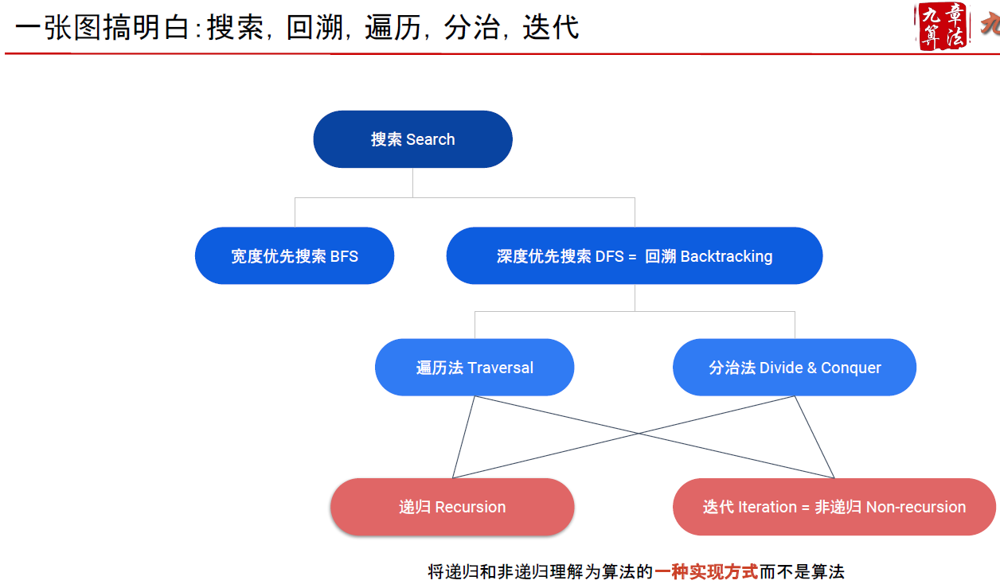

### 96. Unique Binary Search Trees (M)

In [ ]:
# Recursion with memo: Time O(n) Space: O(n)
        
# solution 1
class Solution:       
    def numTrees(self, n: int) -> int:
        return self.helper(n, {})
    
    def helper(self, n, memo):
        if n in [0, 1]:
            return 1
        if n in memo:
            return memo[n]
        res = 0
        for i in range(1, n + 1):
            res += self.helper(i-1, memo) * self.helper(n-i,memo)      
        memo[n] = res
        return res
    
# solution 2   
class Solution:       
    def numTrees(self, n: int) -> int:
        self.memo = {}
        return self.helper(n)
    
    def helper(self, n):
        if n in [0, 1]:
            return 1
        if n in self.memo:
            return self.memo[n]
        res = 0
        for i in range(1, n + 1):
            res += self.helper(i-1) * self.helper(n-i)      
        self.memo[n] = res
        return res
    
# Solution 3
class Solution:     
    def __init__(self):
        self.memo = {}
        
    def numTrees(self, n: int) -> int:
        if n <= 1:
            return 1
        if n in self.memo:
            return self.memo[n]
        res = 0
        for i in range(1, n + 1):
            res += self.numTrees(i-1) * self.numTrees(n-i)     # The requirement of BST determins the function 
        self.memo[n] = res
        return res

        
# DP: Time O(n), Space: O(n)

# F(i, n): for length n, pick i as root value, how many unique BST's 
# G(k): for length k, how many unique BST's
# G(n) = sum(F(i, n)) for i in range(1, n+1)
# F(i, n) = G(i-1)*G(n-i)

class Solution:    
    def numTrees(self, n: int) -> int:
        G = [0]* (n+1)
        G[0] = 1 # empty tree
        G[1] = 1
        for i in range(2, n + 1):
            for j in range(1, i + 1):
                G[i] += G[j - 1] * G[i - j]
                
        return G[n]

### 95. Unique Binary Search Trees II (M)

In [ ]:
# Definition for a binary tree node.
# class TreeNode:
#     def __init__(self, x):
#         self.val = x
#         self.left = None
#         self.right = None

class Solution:
    def generateTrees(self, n: int) -> List[TreeNode]:
        if n == 0:
            return []
        return self.generate_trees_helper(1, n)
    
    def generate_trees_helper(self, start, end):
        if start > end: # return a list not a number
            return [None, ]
        
        all_trees = []
        for i in range(start, end + 1): # pick up a root
            left_trees = self.generate_trees_helper(start, i - 1)
            right_trees = self.generate_trees_helper(i+1, end)
            
            # following "for loop" is inside the previous "for loop"
            for l in left_trees:
                for r in right_trees:
                    root = TreeNode(i)
                    root.left = l
                    root.right = r
                    all_trees.append(root)
                
        return all_trees

### 235. Lowest Common Ancestor of a binary search tree


In [ ]:
# Recursion
class Solution:
    def lowestCommonAncestor(self, root: 'TreeNode', p: 'TreeNode', q: 'TreeNode') -> 'TreeNode':
        
        if p.val > root.val and q.val > root.val:
            return self.lowestCommonAncestor(root.right, p, q)
        elif p.val < root.val and q.val < root.val:
            return self.lowestCommonAncestor(root.left, p, q)
        else:
            return root
        

# Iteratively  O(h), O(1)
class Solution:
    def lowestCommonAncestor(self, root: 'TreeNode', p: 'TreeNode', q: 'TreeNode') -> 'TreeNode':   
        while root:
            root_val = root.val
            if p.val > root_val and q.val > root_val:
                root = root.right
            elif p.val < root_val and q.val < root_val:
                root = root.left
            else: # find the LCA
                return root

### 236. Lowest Common Ancestor of a Binary Tree

In [ ]:
# Recursion
# O(H) O(H)
class Solution:
    def lowestCommonAncestor(self, root: 'TreeNode', p: 'TreeNode', q: 'TreeNode') -> 'TreeNode':
        if not root:
            return None
        if root.val == p.val or root.val == q.val:
            return root
        
        left = self.lowestCommonAncestor(root.left, p, q)
        right = self.lowestCommonAncestor(root.right, p, q)
        
        if left and right: # on both sides
            return root
        elif left: # on left side
            return left
        
        else: # on right side
            return right

### 366. Find Leaves of Binary Tree (M) (binary tree leaf order traversal)


In [ ]:
class Solution:
    def findLeaves(self, root: TreeNode) -> List[List[int]]:
        ret = []
        self.DFS(root, ret)
        return ret
        
    def DFS(self, node, ret):
        if not node:
            return 0
        
        depth = max(self.DFS(node.left, ret), self.DFS(node.right, ret)) + 1
        if len(ret) < depth:
            ret.append([])
        ret[depth - 1].append(node.val)
        return depth

### 987. Vertical Order Traversal of a Binary Tree(M)

In [ ]:
# Time: O(N + K* N/K *log(N/K))  Space: O(N)

class Solution(object):
        def verticalTraversal(self, root):
            """
            :type root: TreeNode
            :rtype: List[List[int]]
            """
            mapping = collections.defaultdict(list)
            queue = collections.deque([(root, 0, 0)]) # pay attention to the format
            res = []
            x_min = x_max = 0
            while queue:
                node, x, y = queue.popleft()
                mapping[x].append((y, node.val))
                x_min, x_max = min(x_min, x), max(x_max, x)
                if node.left:
                    queue.append((node.left, x - 1, y + 1)) # double parenses
                if node.right:
                    queue.append((node.right, x + 1, y + 1))

            for i in range(x_min, x_max + 1):
                res.append([val for col, val in sorted(mapping[i])])

            return res

# Pattern 8 DFS (backtracking)

### [General Backtracking questions solutions in Python for reference](https://leetcode.com/problems/subsets/discuss/429534/General-Backtracking-questions-solutions-in-Python-for-reference-%3A)

### 332. Reconstruct Itinerary

In [15]:
0 or 1

1

In [ ]:
class Solution(object):
    """  """
    def findItinerary(self, tickets):
        """
        :type tickets: List[List[str]]
        :rtype: List[str]
        """
        # Build the graph
        from collections import defaultdict
        self.flightMap = defaultdict(list)

        for origin, dest in tickets:          
            self.flightMap[origin].append(dest)

        self.visitBitmap = {}

        for origin, itinerary in self.flightMap.items():
            itinerary.sort()
            self.visitBitmap[origin] = [False]*len(itinerary)

        self.flights = len(tickets)
        self.result = []
        route = ['JFK']
        self.backtracking('JFK', route)

        return self.result


    def backtracking(self, origin, route):
        if len(route) == self.flights + 1:
            self.result = route
            return True

        for i, nextDest in enumerate(self.flightMap[origin]): # lexical ordered
            if not self.visitBitmap[origin][i]:
                # mark the visit before the next recursion
                self.visitBitmap[origin][i] = True
                ret = self.backtracking(nextDest, route + [nextDest])
                self.visitBitmap[origin][i] = False
                if ret:
                    return True
                
        return False
        

### 721. Accounts Merge

In [ ]:
# https://leetcode.com/problems/accounts-merge/discuss/109161/Python-Simple-DFS-with-explanation!!!

class Solution(object):
    def accountsMerge(self, accounts):
        from collections import defaultdict
        visited_accounts = [False] * len(accounts)
        emails_accounts_map = defaultdict(list)
        res = []
        # Build up the graph.
        for i, account in enumerate(accounts):
            for j in range(1, len(account)):
                email = account[j]
                emails_accounts_map[email].append(i)
                
        # DFS code for traversing accounts.
        def dfs(i, emails):
            if visited_accounts[i]:
                return
            visited_accounts[i] = True
            for j in range(1, len(accounts[i])):
                email = accounts[i][j]
                emails.add(email)
                for neighbor in emails_accounts_map[email]:
                    dfs(neighbor, emails)
                    
        # Perform DFS for accounts and add to results.
        for i, account in enumerate(accounts):
            if visited_accounts[i]:
                continue
            name, emails = account[0], set()
            dfs(i, emails)
            res.append([name] + sorted(emails))
        return res

### 77. Combinations

In [ ]:
class Solution(object):
    def combine(self, n, k): # choose k out from n, [2, 4] is valid while [4, 2] is not
        res = []
        self.dfs(range(1,n+1), k, 0, [], res)
        return res
    
    def dfs(self, nums, k, index, path, res):

        if k == 0: # stop condition
            res.append(path)
            return # backtracking 
        
        for i in range(index, len(nums)):
            self.dfs(nums, k-1, i+1, path+[nums[i]], res)      
            
            
class Solution:
    def combine(self, n: int, k: int) -> List[List[int]]:
        nums = range(1, n + 1)
        return self.dfs(nums, k, 0, [], [])
    
    def dfs(self, nums, k, index, path, res):
        if not k:
            res.append(path)
        for i in range(index, len(nums)):
            self.dfs(nums, k-1, i+1, path + [nums[i]], res)
        return res

### 78 subsets

In [ ]:
# compared with 77 combinations, there is no k limitation

class Solution(object):
    def subsets(self, nums): # order matters [1,3] is valid while [3, 1] is not valid
        res = []
        self.dfs(sorted(nums), 0, [], res)
        return res
    
    def dfs(self, nums, index, path, res): 
        res.append(path)
        for i in range(index, len(nums)):
            self.dfs(nums, i+1, path+[nums[i]], res)

### 90 subsets II remove duplicates

In [ ]:
class Solution(object):
    def subsetsWithDup(self, nums):
        res = []
        nums.sort()
        self.dfs(nums, 0, [], res)
        return res
    
    def dfs(self, nums, index, path, res):
        res.append(path)
        for i in range(index, len(nums)):
            if i > index and nums[i] == nums[i-1]: # i - 1 has been used
                continue
            self.dfs(nums, i+1, path+[nums[i]], res)

### [全排列问题是“排列式”深度优先搜索问题的鼻祖。很多搜索的问题都可以用类似全排列的代码来完成。包括我们前面学过的全子集问题(subsets)的一种做法。](https://www.jiuzhang.com/tutorial/algorithm/418)

### 46. Permutation

In [ ]:
# DFS
# Time O(N!)
# Space O(N!)
# no index needed since the order doesn't matter

class Solution:
    def permute(self, nums: List[int]) -> List[List[int]]: # order doesn't matter [1, 3] and [3, 1] are both valid
        return self.dfs(nums, [], [])
    
    def dfs(self, nums, path, res):
        if not nums:
            res.append(path)
        for i in range(len(nums)):
            self.dfs(nums[:i] + nums[i+1:], path + [nums[i]], res) # [nums[i]] not nums[i]
        return res
            


### 47. Permutations II

In [ ]:
# DFS
# Time worst O(N!)
# Space O(N!)

class Solution:
    def permuteUnique(self, nums: List[int]) -> List[List[int]]:
        visited = [False] * len(nums)
        return self.dfs(sorted(nums), visited, [], []) # no index pass in since there is no order
    
    def dfs(self, nums, visited, path, res):
        if len(path) == len(nums):
            res.append(path)
            
        for i in range(len(nums)):
            if not visited[i]:
                if i > 0 and nums[i] == nums[i-1] and not visited[i-1]:
                    continue
                visited[i] = True
                self.dfs(nums, visited, path + [nums[i]], res) # [nums[i]] not nums[i]
                visited[i] = False
            
        return res

### 39. Combination Sum

In [ ]:
def combinationSum(self, candidates, target):
    res = []
    candidates.sort()
    self.dfs(candidates, target, 0, [], res)
    return res
    
def dfs(self, nums, target, index, path, res):
    if target < 0:
        return  # backtracking
    if target == 0:
        res.append(path)
        return 
    for i in range(index, len(nums)):
        self.dfs(nums, target-nums[i], i, path+[nums[i]], res) # nums[i] could be reused

### 40. Combination Sum II

In [3]:
class Solution:
    def combinationSum2(self, candidates, target):
        res = []
        candidates.sort()
        self.dfs(candidates, target, 0, [], res)
        return res
    
    def dfs(self, candidates, target, index, path, res):
        if target < 0:
            return  # backtracking
        if target == 0:
            res.append(path)
            return  # backtracking 
        for i in range(index, len(candidates)):
            if candidates[i] > target: # early stop
                break
            if i > index and candidates[i] == candidates[i-1]:
                continue
            self.dfs(candidates, target-candidates[i], i+1, path+[candidates[i]], res) # index update to i + 1 since each number can be used once

### 17. Letter Combinations of a Phone Number


In [ ]:

KEYBOARD = {
    '2': 'abc',
    '3': 'def',
    '4': 'ghi',
    '5': 'jkl',
    '6': 'mno',
    '7': 'pqrs',
    '8': 'tuv',
    '9': 'wxyz',
}

class Solution:
    def letterCombinations(self, digits: str) -> List[str]:
        if not digits:
            return []
        
        return self.dfs(digits, 0, '', [])
    
    def dfs(self, digits, index, combination, res):
        if index == len(digits):
            res.append(combination)
            return
        
        for letter in KEYBOARD[digits[index]]: # the difference with combination is it has to traverse one by one in order, however, combination can jump to the last letter
            self.dfs(digits, index + 1, combination + letter, res)
            
        return res




### 79. Word Search(M)

In [ ]:
# DFS
# Time O(N*4^L) N: number of cells in the board
# Space O(N)

class Solution:
    def exist(self, board: List[List[str]], word: str) -> bool:
        if not board or not word or len(word) > len(board)*len(board[0]):
            return False
        
        visited = [[False]*len(board[0]) for i in range(len(board))]
        
        for i in range(len(board)):
            for j in range(len(board[0])):
                
                # find the first match and start dfs
                if board[i][j] == word[0]:
                    visited[i][j] = True
                    if self.dfs(board, i, j, 0, word, visited):
                        return True
                    visited[i][j] = False # set back to False
        return False
    
    def dfs(self, board, x, y, word, visited):
        if index == len(word) - 1:
            return True
        
        for (delta_x, delta_y) in [(-1, 0), (1, 0), (0, -1), (0, 1)]:
            next_x, next_y = x + delta_x, y + delta_y
            if self.is_valid(board, next_x, next_y) and not visited[next_x][next_y] and board[next_x][next_y] == word[index + 1]:
                visited[next_x][next_y] = True
                if self.dfs(board, next_x, next_y, index + 1, word[1:], visited):
                    return True
                visited[next_x][next_y] = False # set back to False because it could be vistited again
        return False
                

    def is_valid(self, board, x, y):
        return 0 <= x < len(board) and 0 <= y < len(board[0])
            

### 489. Robot Room Cleaner

In [ ]:
class Solution:
    def cleanRoom(self, robot):
        """
        :type robot: Robot
        :rtype: None
        """

        def turn_around():
            robot.turnRight()
            robot.turnRight()
            robot.move()
            robot.turnRight()
            robot.turnRight()

        def backtrack(cell=(0, 0), d=0):
            visited.add(cell)
            robot.clean()
            # going clockwise : 0: 'up', 1: 'right', 2: 'down', 3: 'left'
            # Explore four directions
            for i in range(4):
                new_d = (d + i) % 4
                new_cell = (cell[0] + directions[new_d][0], cell[1] + directions[new_d][1])
                if new_cell not in visited and robot.move():
                    backtrack(new_cell, new_d)
                    turn_around()  # back to explore other directions
                robot.turnRight()

        directions = [(-1, 0), (0, 1), (1, 0), (0, -1)]
        visited = set()
        backtrack()

### 22. Generate Parentheses

In [ ]:
class Solution:
    def generateParenthesis(self, n: int) -> List[str]:
        ans = []
        def backtrack(cur, left, right):
            if len(cur) == 2 * n:
                ans.append(cur)
                return
            if left < n:
                backtrack(cur + '(', left + 1, right)
            if right < left:
                backtrack(cur + ')', left, right + 1)
        backtrack("", 0, 0)
        return ans

### 37. Sudoku Solver

In [ ]:
# Solution 1: DFS with list as marker
# Time O(N!^N) Space O(N)
class Solution:
    def solveSudoku(self, board: 'List[List[str]]') -> 'None':
        # Initialize to False
        self.cols = [[False] * 10 for i in range(9)]
        self.rows = [[False] * 10 for i in range(9)]
        self.boxes = [[False] * 10 for i in range(9)]
        # For every existing number, mark it to True
        for i in range(9):
            for j in range(9):
                if board[i][j] != '.':
                    val = int(board[i][j])
                    self.rows[i][val] = True
                    self.cols[j][val] = True
                    self.boxes[i // 3 + j // 3 * 3][val] = True
        self.fill(board, 0, 0)

    def fill(self, board, x, y):
        if y == 9:
            return True
        # Move in the row direction
        nx = (x + 1) % 9
        ny = y + (nx == 0) * 1
        if board[x][y] != ".":
            return self.fill(board, nx, ny)
            # if board[x][y] == '.'
        # Backtracking
        for i in range(1, 10):
            if not self.rows[x][i] and not self.cols[y][i] and not self.boxes[x // 3 + y // 3 * 3][i]:
                self.rows[x][i] = True
                self.cols[y][i] = True
                self.boxes[x // 3 + y // 3 * 3][i] = True
                board[x][y] = str(i)
                if self.fill(board, nx, ny):
                    return True
                self.rows[x][i] = False
                self.cols[y][i] = False
                self.boxes[x // 3 + y // 3 * 3][i] = False
                board[x][y] = '.'
        return False

### 212. Word Search II

In [ ]:
class Solution(object):
    def findWords(self, board, words):
        """
        :type board: List[List[str]]
        :type words: List[str]
        :rtype: List[str]
        """
        if not board or not board[0]:
            return []
        
        trie = Trie()
        for word in words:
            trie.insert(word)
        
        res = []
        for i in range(len(board)):
            for j in range(len(board[0])):
                self.dfs(board, i, j, "", trie.root, res)
        
        return res
                    
    
    def dfs(self, board, i, j, path, node, res):
        # board[i][j] is not included in path yet
        # node is the node of the last letter in path
        
        if node.is_word:
            res.append(path)
            node.is_word = False  # important !! delete the found word from dictionary
        
        # this if clause can not be moved inside the for loop below
        # otherwise fails in the case board = [["a"]], words=["a"]
        if i < 0 or i >= len(board) or j < 0 or j >= len(board[0]) \
            or board[i][j] not in node.children:  
            return
        
        cur = board[i][j]
        board[i][j] = "#"
        for v in [(-1,0), (1,0), (0,-1), (0,1)]:
            p, q = i+v[0], j+v[1]
            self.dfs(board, p, q, path+cur, node.children[cur], res)
        board[i][j] = cur
        
        

class TrieNode(object):
    def __init__(self):
        self.is_word = False
        self.children = {}
        
        
class Trie(object):
    def __init__(self):
        self.root = TrieNode()
    
    def insert(self, word):
        node = self.root
        for c in word:
            if c not in node.children:
                node.children[c] = TrieNode()
            node = node.children[c]
        node.is_word = True

### 282. Expression Add Operators

In [ ]:
# https://www.youtube.com/watch?v=v05R1OIIg08

class Solution:
    def addOperators(self, num: str, target: int) -> List[str]:
        def backtracking(index, prefix, cur_value, prev):
            if index == len(num) and cur_value == target:
                res.append(prefix)
                return # don't forget this return
            
            for j in range(index + 1, len(num) + 1): # pay attention to the range
                next_part = num[index:j]
                n = int(next_part)
                if next_part != '0' and num[index] == '0': # prevent "0*" as a number, but 0 + 0, 0 - 0, 0 * 0 are allowed
                    continue
                    
                if index == 0: # if there is no prev
                    backtracking(j, next_part, n, n)
                else:
                    backtracking(j, prefix + '+' + next_part, cur_value + n, n)
                    backtracking(j, prefix + '-' + next_part, cur_value - n, -n)
                    backtracking(j, prefix + '*' + next_part, cur_value - prev + prev * n, prev * n)

        res = []
        backtracking(0, "", 0, 0)
        return res

### 322. Coin Change

In [ ]:
# dfs + memo: there is overlap problem == dp solution
class Solution:
    def coinChange(self, coins: List[int], amount: int) -> int:
        
        return self.dfs(coins, amount, {}) if self.dfs(coins, amount, {}) != float("inf") else -1
    
    def dfs(self, coins, amount, memo):# return the fewest number of coins to make up amount
        if amount in memo:
            return memo[amount]
        if amount == 0:
            return 0
        if amount in coins:
            return 1
        if amount < min(coins):
            return float("inf")
        memo[amount] = min(1 + self.dfs(coins, amount - coin, memo) for coin in coins)
        return memo[amount]
    

### 403. Frog Jump

In [ ]:
class Solution(object):
    def canCross(self, stones):
        """
        :type stones: List[int]
        :rtype: bool
        """
        target, stones, memo = stones[-1], set(stones), set()
        return self.backtrack(stones, 1, 1, target, memo) # the first jump must be 1 unit
        
    def backtrack(self, stones, pos, jump, target, memo):
        if (pos, jump) in memo: # The memo dict is using for save those dead end. So when we get to the same stone with the same speed we don't need to search further.
            return False
        
        if pos == target:
            return True
        
        if jump <= 0 or pos not in stones:# fall into the water
            return False
        
        for j in (jump-1, jump, jump+1):
            if self.backtrack(stones, pos+j, j, target, memo):
                return True
            
        memo.add((pos, jump))   # record bad position and jump
        return False

### 51. N-Queens

In [ ]:
# O(N!) O(N)
class Solution:
    def solveNQueens(self, n):
        """
        :param n: 
        :return: 
        """
        res = []
        
        def dfs(queens, ddiff, ssum): # each row place one queen: represented by index col
            p = len(queens) # row index
            
            if p == n:# a solution
                queens = ['.' * i + 'Q' + '.' * (n - 1 - i) for i in queens] # i: index column in each row
                res.append(queens)
                return
            
            for q in range(n): #try to place at index q at row p
                if q in queens or p - q in ddiff or p + q in ssum: 
                    continue
                dfs(queens + [q], ddiff + [p - q], ssum + [p + q])
                
        dfs([], [], [])
        return res

### 140. Word Break II

In [ ]:
class Solution:
    def wordBreak(self, s: str, wordDict: List[str]) -> List[str]:
        return self.dfs(s, wordDict, {})
    
    def dfs(self, s, wordDict, memo):
        partitions = []
        if s in memo:
            return memo[s]
        if not s:
            return        
        if s in wordDict:
            partitions.append(s)
            
        for i in range(1, len(s)):
            prefix = s[:i]
            if prefix not in wordDict:
                continue
            subpartitions = self.dfs(s[i:], wordDict, memo)
            for subpartition in subpartitions:
                partitions.append(prefix + " " + subpartition)
            
        memo[s] = partitions
        return partitions
 

 class Solution:
    def wordBreak(self, s: str, wordDict: List[str]) -> List[str]:
        return self.dfs(s, wordDict, {})
    
    def dfs(self, s, wordDict, memo):
        if s in memo: 
            return memo[s]
        if not s: 
            return []

        res = []
        for word in wordDict: # iterate in the wordDict
            if not s.startswith(word):
                continue
            if len(word) == len(s):
                res.append(word)
            else:
                resultOfTheRest = self.dfs(s[len(word):], wordDict, memo)
                for item in resultOfTheRest:
                    item = word + ' ' + item
                    res.append(item)
        memo[s] = res
        return res       

# Pattern 9 Dynamic Programming

Dynamic programming is similar to the divide-and-conquer approach in that the solution of a large problem depends on previously obtained easier subproblems. The significant difference, however, is that dynamic programming permits subproblems to overlap. By overlap, we mean that the subproblem can be used in the solution of two different subproblems. In contrast, the divide-and-conquer approach creates subproblems that are completely separate and can be solved independently. Usually, DP problem can also be solved with dfs + memo.


[DP problem classification](https://leetcode.com/problems/longest-palindromic-subsequence/discuss/222605/DP-Problem-Classifications-Helpful-Notes)

[Clean examples of DP](https://www.eecs.yorku.ca/course_archive/2003-04/S/3101A/notes/dp.pdf)

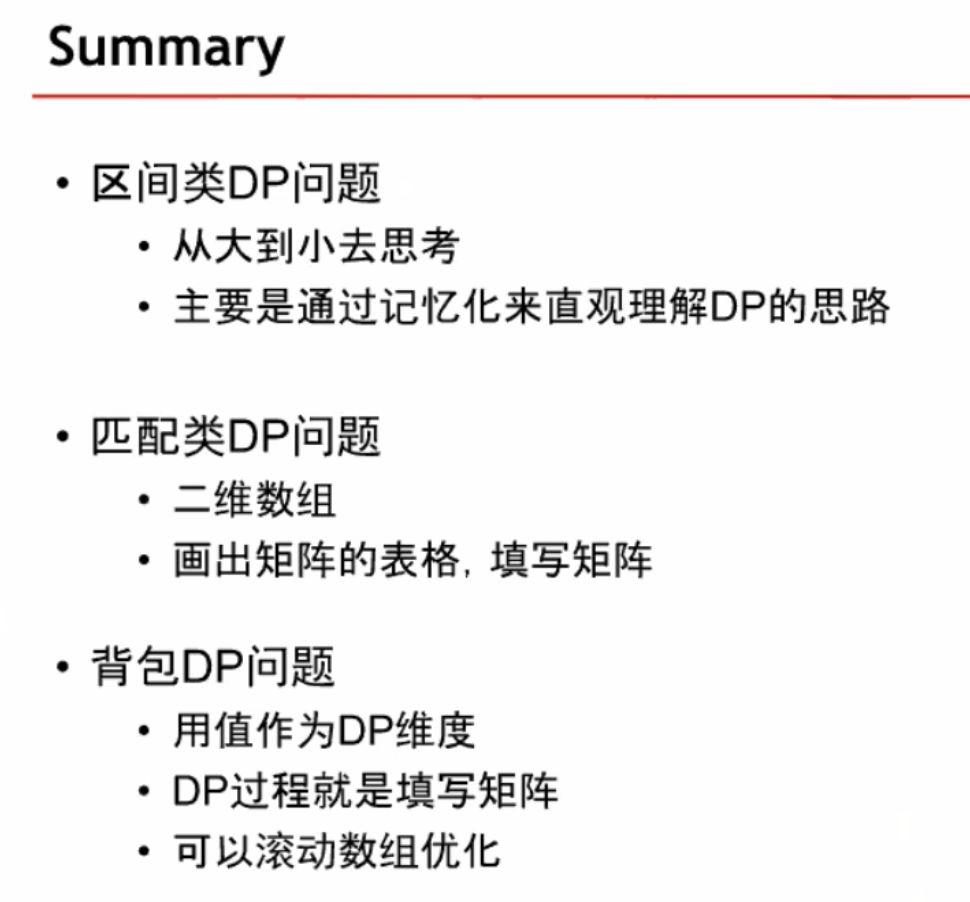

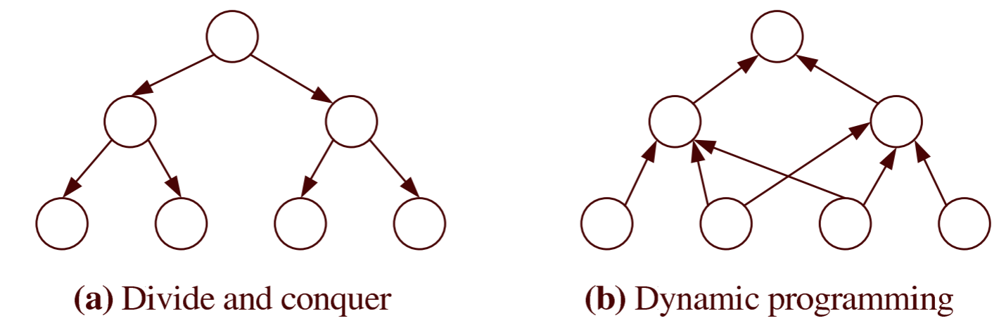

### 256. Paint House

In [ ]:
class Solution(object):
           
        def minCost(self, costs):
            for i in range(1, len(costs)):
                for color in range(3):                    
                    costs[i][color] += min(costs[i - 1][nc] for nc in range(3) if nc!= color)               

            if len(costs) == 0: 
                return 0
            return min(costs[-1]) 

### 1197. Minimum Knight Moves

In [ ]:
# symmetric
from functools import lru_cache
class Solution:
    def minKnightMoves(self, x: int, y: int) -> int:
        @lru_cache(None) 
        def DP(x,y):
            if x == 0 and y == 0:
                return 0
            elif x + y == 2:
                return 2
            return min(DP(abs(x-1),abs(y-2)),DP(abs(x-2),abs(y-1)))+1
        return DP(abs(x),abs(y))

### 139. Word break

In [ ]:
class Solution:
    def wordBreak(self, s, wordDict):
        n = len(s)
        dp = [True] + [False] * n  
        
        for i in range(1,n+1): # dp[i] the first i characters could be broken or not
            for w in wordDict:
                if dp[i-len(w)] and s[i-len(w):i] == w:
                    dp[i]=True
        return dp[-1]

### 91. Decode Ways(M)

In [ ]:
# DP
# Time O(n), Space O(n)
class Solution:
    def numDecodings(self, s: str) -> int:
        dp = [0] * (len(s) + 1)
        dp[0]= 1
        dp[1] = 1 if s[0] != '0' else 0 # attention
        for i in range(2, len(s) + 1):            
                dp[i] = (s[i-1] != '0') * dp[i-1] + (int(s[i-2:i]) in range(10, 27)) * dp[i-2]  # last digit and last two digit 
        return dp[-1]

    
# O(N) O(1)
class Solution(object):
    def numDecodings(self, s):
        if not s:
            return 0

        # Array to store the subproblem results
        dp = [0 for _ in range(3)]

        dp[0] = 1
        dp[1] = 0 if s[0] == '0' else 1

        for i in range(2, len(s) + 1):
            # Check if successful single digit decode is possible.
            if s[i-1] != '0':
                dp[i%3] += dp[(i-1)%3]

            # Check if successful two digit decode is possible.
            two_digit = int(s[i-2 : i])
            if two_digit >= 10 and two_digit <= 26:
                dp[i%3] += dp[(i-2)%3]
        return dp[len(s)%3]

### 516. Longest Palindromic Subsequence

In [1]:
# DP problems usually can be solved with dfs with memo

# Following Approach is dynamic programming O(N**2) O(N**2)

# Method 1 this is backward solution: first known value is DP[len(s)-1][len(s)-1]
def Longest_Palin_Subsequence(s):
    if len(s) ==0:
        return 0
    
    DP = [[0]*len(s) for _ in range(len(s))]
    
    # DP[i][j] means the length of Palindromic subsequence of substring s[i:(j+1)]
    for i in range(len(s)-1, -1, -1):  # bottom-to-up:  
        DP[i][i] = 1
        for j in range(i+1,len(s)):  # j is larger than i
            if s[i] == s[j]:
                DP[i][j] = DP[i+1][j-1] + 2
            else:
                DP[i][j] = max(DP[i+1][j], DP[i][j-1])
            
    return DP[0][len(s)-1]

# Method 2: this is forward solution: first known value is DP[0][0]
class Solution:
    def longestPalindromeSubseq(self,s):
        if len(s) ==0:
            return 0
        
        DP = [[0]*len(s) for _ in range(len(s))] # DP[i][j] means the maximum length of Palindromic subsequence of substring s[i:(j+1)]
    
        for i in range(len(s)):  # 
            DP[i][i] = 1                    
            for j in range(i-1,-1,-1):  # j is smaller than i
                if s[i] == s[j]:
                    DP[j][i] = DP[j+1][i-1] + 2 # when j = i - 1, DP[i-1][i] += 2
                else:
                    DP[j][i] = max(DP[j][i-1], DP[j + 1][i])
            
        return DP[0][len(s)-1]
    
# Top - down DP with memo O(N**2) O(N)
class Solution:
    def longestPalindromeSubseq(self, s: str) -> int:
        if not s:
            return 0
        self.memo = {}

        n = len(s)
        return self.dfs(s, 0, n - 1)

    def dfs(self, s, left, right):
        if (left, right) in self.memo:
            return self.memo[(left, right)]
        if left > right:
            return 0
        if left == right:
            return 1
        if s[left] == s[right]:
            self.memo[(left, right)] = 2 + self.dfs(s, left + 1, right - 1)
        else:
            self.memo[(left, right)] = max(self.dfs(s, left + 1, right), self.dfs(s, left, right - 1))

        return self.memo[(left, right)]    

### 322. Coin Change
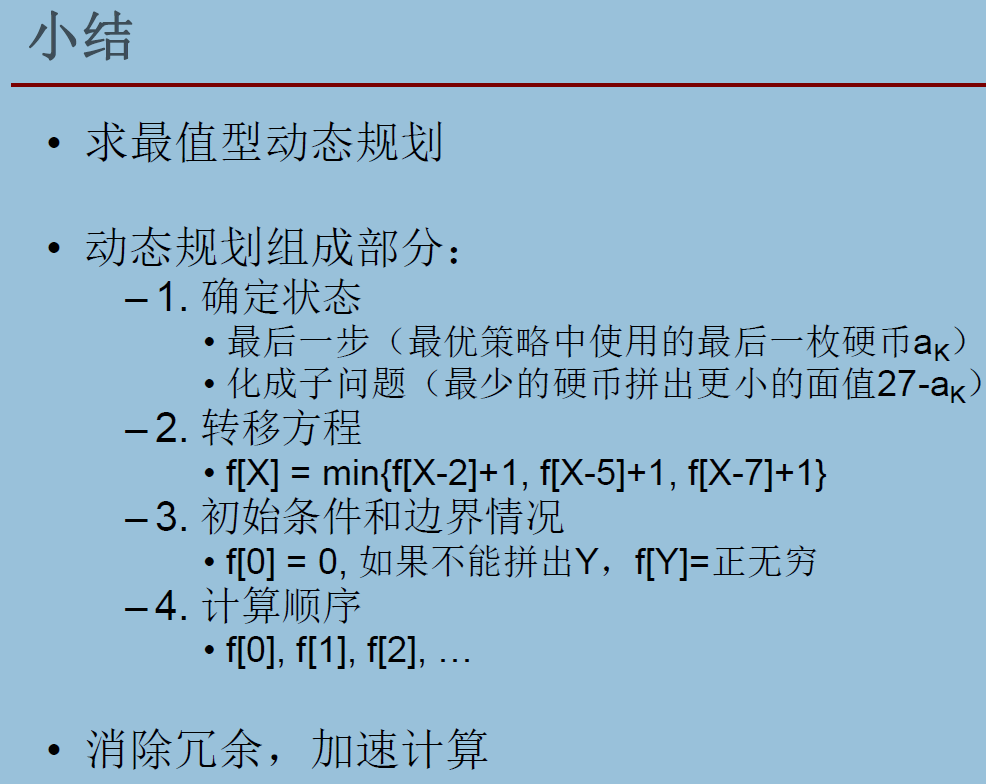

In [7]:
# DP
class Solution:
    def coinChange(self, coins: List[int], amount: int) -> int:
        min_coin = [0] + [float("inf")] * amount
        for coin in coins:
            for i in range(coin, amount + 1):
                min_coin[i] = min(min_coin[i], min_coin[i - coin] + 1)

        return min_coin[-1] if min_coin[-1] != float("inf") else -1


# Top down DFS + memo

class Solution:
    def coinChange(self, coins: List[int], amount: int) -> int:

        return self.dfs(coins, amount, {}) if self.dfs(coins, amount, {}) != float("inf") else -1

    def dfs(self, coins, amount, memo):  # return the fewest number of coins to make up amount
        if amount in memo:
            return memo[amount]
        if amount == 0:
            return 0
        if amount in coins:
            return 1
        if amount < min(coins):
            return float("inf")
        memo[amount] = min(1 + self.dfs(coins, amount - coin, memo) for coin in coins)
        return memo[amount]

### 518. Coin change 2

In [5]:
# Explanation: https://leetcode.com/problems/coin-change-2/discuss/429736/Python-intuitive-DP-solution

class Solution:
    def change(self, amount: int, coins: List[int]) -> int:
        dp = [0] * (amount + 1)
        dp[0] = 1
        
        for coin in coins:
            for x in range(coin, amount + 1):
                dp[x] += dp[x - coin] 
                
        return dp[amount]
    

### 62. Unique Paths

In [ ]:
# DP
# Time O(mn)
# Space O(mn)

class Solution:
    def uniquePaths(self, m: int, n: int) -> int:
        dp = [[1]*n for _ in range(m)] 
        for i in range(1, m):
            for j in range(1, n):
                    dp[i][j] = dp[i-1][j] + dp[i][j-1]
                    
        return dp[m-1][n-1]       

### 55. Jump Game 存在型动态规划

In [ ]:
# DP O(n^2) O(n)
class Solution:
    def canJump(self, nums: List[int]) -> bool:
        ans = [False for i in range(len(nums))] # initialize to False
        ans[0] = True
        
        for i in range(1, len(nums)):
            for j in range(i,-1,-1): # avoid TLE in the case[1,1,1,....1,1,1]
                if nums[j] >= (i - j) and ans[j]:
                    ans[i] = True
                    break # if already know it is True
        return ans[len(nums) - 1]

    
# Greedy O(n) O(1)
class Solution:
    def canJump(self, nums: List[int]) -> bool:
        n = len(nums)
        if n <= 1:
            return True
        
        max_length = 0
        for i in range(n - 1):
            if i > max_length: # early stop
                return False
            else:
                max_length = max(max_length, i + nums[i])
        return max_length >= n - 1

### 45. Jump Game II

In [ ]:
# Greedy O(n) O(1)
class Solution:
    def jump(self, nums: List[int]) -> int:
        n = len(nums)
        if n < 2:
            return 0

        max_pos = nums[0]
        max_steps = nums[0]

        jumps = 1
        for i in range(1, n):
            # if to reach this point
            # one needs one more jump
            if max_steps < i:
                jumps += 1
                max_steps = max_pos
            max_pos = max(max_pos, nums[i] + i)

        return jumps


# method 2: dp, record the smallest jumps to reach each number
# O(n*2), time limit exceeded
class Solution2(object):
    def jump(self, nums):
        """
        :type nums: List[int]
        :rtype: int
        """
        n = len(nums)
        if n < 2:
            return 0
        jumps = [n for _ in range(n)]
        jumps[0] = 0  # don't forget !

        for i in range(1, n):
            for j in range(i):
                # save the smallest jump
                if j + nums[j] >= i:
                    jumps[i] = min(jumps[i], jumps[j] + 1)

        return jumps[-1]

### 152. Maximum Product Subarray


In [ ]:
# O(n) O(1)
class Solution:
    def maxProduct(self, nums: List[int]) -> int:
        if not nums:
            return None
        
        global_max = prev_max = prev_min = nums[0]
        for num in nums[1:]:
            if num > 0:
                cur_max = max(prev_max * num, num)
                cur_min = min(prev_min * num, num)
            else:
                cur_max = max(prev_min * num, num)
                cur_min = min(prev_max * num, num)
                
            global_max = max(global_max, cur_max)
            
            prev_max, prev_min = cur_max, cur_min
            
        return global_max

### 10. Regular Expression Matching

In [ ]:
# Top-down dp: DFS

# O(TP) O(TP)

# dp(i, j): does text[i:] and pattern[j:] match？

class Solution(object):
    def isMatch(self, text, pattern):
        memo = {}
        
        def dp(i, j):         
            if (i, j) in memo:
                return memo[(i, j)]
            
            if j == len(pattern): # corner case: current pattern is empty
                ans = i == len(text)
                
            else:
                first_match = i < len(text) and pattern[j] in {text[i], '.'} # text is not empty
                if j+1 < len(pattern) and pattern[j+1] == '*':
                    ans = dp(i, j+2) or first_match and dp(i+1, j) # repeat or not repeat ".*" => " " or "....."
                else:
                    ans = first_match and dp(i+1, j+1)

            memo[(i, j)] = ans
            return memo[(i, j)]

        return dp(0, 0)

### 300. Longest Increasing Subsequence

In [ ]:
# DP
# O(n^2) O(n)
class Solution:
    def lengthOfLIS(self, nums: List[int]) -> int:
        length = len(nums)
        if length <= 1:
            return length
        dp = [1] * length
        
        for i in range(length):
            for j in range(i):
                if nums[j] < nums[i] and dp[j] + 1 > dp[i]:
                    dp[i] = dp[j] + 1
                    
        return max(dp)
    
    
class Solution:
    def longestIncreasingSubsequence(self, nums):    
        # state: dp[i] longest sequence ending with ith element
        
        # initialization: dp[0..n-1] = 1
        dp = [1] * len(nums)
        
        # prev[i] 代表 dp[i] 的最优值是从哪个 dp[j] 算过来的
        prev = [-1] * len(nums)
        
        # function dp[i] = max{dp[j] + 1},  j < i and nums[j] < nums[i]
        for i in range(len(nums)):
            for j in range(i):
                if nums[j] < nums[i] and dp[i] < dp[j] + 1:  #不断比较，最后得到的dp[i]就是最大值
                    dp[i] = dp[j] + 1
                    prev[i] = j  #记录dp[i]是从哪个j过来的
        
        # answer: max(dp[0..n-1])
        longest, last = 0, -1
        for i in range(len(nums)):
            if dp[i] > longest:
                longest = dp[i]  #全局最大值
                last = i #并记录最后一个元素的位置i
        
        path = []
        while last != -1:
            path.append(nums[last])
            last = prev[last]
        print(path[::-1])
        
        return longest
                

### 368 Largest divisible subset

In [1]:
class Solution:

    def largestDivisibleSubset(self, nums):
        n = len(nums)
        dp = [1] * n
        father = [-1] * n

        nums.sort()
        m, index = 0, -1
        for i in range(n):
            for j in range(i):
                if nums[i] % nums[j] == 0 and 1 + dp[j] > dp[i]:
                    dp[i] = dp[j] + 1
                    father[i] = j

            if dp[i] >= m:
                m = dp[i]
                index = i

        result = []
        for i in range(m):
            result.append(nums[index])
            index = father[index]

        return result

### 64. Minimum Path Sum

In [ ]:
# DP
# Time O(n)
# Space O(1)

class Solution:
    def minPathSum(self, grid):
        for i in range(len(grid)):
            for j in range(len(grid[0])):
                if i == 0 and j > 0:
                    grid[i][j] += grid[i][j-1]
                elif j == 0 and i > 0:
                    grid[i][j] += grid[i-1][j]
                elif i > 0 and j > 0:
                    grid[i][j] += min(grid[i-1][j], grid[i][j-1])
        return grid[-1][-1]

### 63. Unique Paths II

In [ ]:
# DP
# Time O(mn)
# Space O(mn)
class Solution:
    def uniquePathsWithObstacles(self, obstacleGrid: List[List[int]]) -> int:
        if not obstacleGrid or not obstacleGrid[0]:
            return 0
        m, n =  len(obstacleGrid), len(obstacleGrid[0])
        
        for i in range(m):
            for j in range(n):
                if obstacleGrid[i][j] == 1:
                    obstacleGrid[i][j] = 0
                else:
                    if i == 0 and j == 0:
                        obstacleGrid[i][j] = 1
                    elif i == 0 and j > 0:
                        obstacleGrid[i][j] = obstacleGrid[i][j-1]
                    elif j == 0 and i > 0:
                        obstacleGrid[i][j] = obstacleGrid[i-1][j]
                    else:   
                        obstacleGrid[i][j] = obstacleGrid[i-1][j] + obstacleGrid[i][j-1]                  
        return obstacleGrid[m-1][n-1]
        

## 0/1 Knapsack

### 416. Partition Equal Subset Sum

In [ ]:
# Backpack + rolling pointer
# Time O(mn)
# Space O(m)

class Solution:
    def canPartition(self, nums: List[int]) -> bool:
        n = len(nums)
        if n <= 1:
            return False
        if sum(nums) % 2 != 0:
            return False

        # Convert into backpack 0/1 problem
        m = sum(nums)//2
        f = [[False] * (m + 1) for _ in range(2)]
        f[0][0] = True

        for i in range(1, n + 1):
            f[i%2][0] = True
            for j in range(1, m + 1):
                if j >= nums[i - 1]:
                    f[i%2][j] = f[(i - 1)%2][j] or f[(i - 1)%2][j - nums[i - 1]]
                else:
                    f[i%2][j] = f[(i - 1)%2][j]

        for i in range(n - 1, -1, -1):
            if f[i%2][m]:
                return True
        return False

# memory 1D array
# O(mn) O(m)
class Solution:
    def canPartition(self, nums: List[int]) -> bool:
        n = len(nums)
        if n <= 1:
            return False
        if sum(nums) % 2 != 0:
            return False

        # Convert into backpack 0/1 problem
        m = sum(nums)//2
        f = [False] * (m + 1)   # f[i]:if can form bag size i
        f[0] = True

        for item in nums:
            for j in range(m, -1, -1):
                if j >= item:
                    f[j] = f[j] or f[j - item] # for each item, choose or not

        return f[m]

# Similar to 40 combination sum
# DFS Time Space?
class Solution:
    def canPartition(self, nums: List[int]) -> bool:
        n = len(nums)
        if n <= 1:
            return False
        if sum(nums) % 2 != 0:
            return False
        target = sum(nums) // 2

        # Convert into combination sum
        return self.dfs(sorted(nums), 0, target)

    def dfs(self, candidates, index, target):
        if not target:
            return True
        for i in range(index, len(candidates)):
            if candidates[i] > target:
                continue
            if i > index and candidates[i] == candidates[i - 1]:
                continue
            if self.dfs(candidates, i + 1,
                        target - candidates[i]):  # index update to i + 1 since each number can be used once
                return True

        return False


### 494. Target Sum

In [ ]:
# DP
class Solution:    
    def findTargetSumWays(self, nums: List[int], S: int) -> int:  
        if S > sum(nums):
            return 0
        
        target = (S + sum(nums))//2
        return self.count_subsets(nums, target)
        
    def count_subsets(self, num, sum):
        n = len(num)
        dp = [[-1 for x in range(sum+1)] for y in range(n)]

        for i in range(0, n):
            dp[i][0] = 1

        for s in range(1, sum+1):
            dp[0][s] = 1 if num[0] == s else 0

        for i in range(1, n):
            for s in range(1, sum+1):
              # exclude the number
                dp[i][s] = dp[i - 1][s]
              # include the number, if it does not exceed the sum
                if s >= num[i]:
                    dp[i][s] += dp[i - 1][s - num[i]]

          # the bottom-right corner will have our answer.
        return dp[n - 1][sum]

### 198. House Robber

In [ ]:
#使用滚动数组(rolling pointer)的做法，将每个下标直接 % 3。
#时间复杂度 O(n)，空间复杂度 O(1)
class Solution:
    def rob(self, nums: List[int]) -> int:
        n = len(nums)
        
        if not nums:
            return 0
        if n <= 2:
            return max(nums)
        
        
        f = [0] * 3
        f[0] = 0
        f[1] = nums[0]
        
        for i in range(2, n + 1):
            f[i%3] = max(f[(i-1)%3], f[(i-2)%3] + nums[i-1])
            
        return f[n%3]

### 221. Maximal Square

In [ ]:
# Rolling pointer
class Solution:
    """
    @param matrix: a matrix of 0 and 1
    @return: an integer
    """
    def maxSquare(self, matrix):
        if not matrix or not matrix[0]:
            return 0
            
        n, m = len(matrix), len(matrix[0])
        
        # intialization
        f = [[0] * m, [0] * m]
        for i in range(m):
            f[0][i] = matrix[0][i] # fisrt row
            
        edge = max(matrix[0]) # 1 or 0
        
        for i in range(1, n):
            f[i % 2][0] = matrix[i][0] # edges
            
            for j in range(1, m):
                if matrix[i][j]:
                    f[i % 2][j] = min(f[(i - 1) % 2][j], f[i % 2][j - 1], f[(i - 1) % 2][j - 1]) + 1 # need good understanding    
                else:
                    f[i % 2][j] = 0
            edge = max(edge, max(f[i % 2]))

        return edge * edge

## Match DP

### 72 Edit Distance

In [ ]:
class Solution:
    def minDistance(self, word1, word2):
        n, m = len(word1), len(word2)
        f = [[0] * (m + 1), [0] * (m + 1)]
        
        for j in range(m + 1):
            f[0][j] = j

        for i in range(1, n + 1):
            f[i % 2][0] = i
            for j in range(1, m + 1):
                if word1[i - 1] == word2[j - 1]:
                    f[i % 2][j] = min(f[(i - 1) % 2][j - 1], f[(i - 1) % 2][j] + 1, f[i % 2][j - 1] + 1)
                    # equivalent to f[i % 2][j] = f[(i - 1) % 2][j - 1]
                else:
                    f[i % 2][j] = min(f[(i - 1) % 2][j - 1], f[(i - 1) % 2][j], f[i % 2][j - 1]) + 1                      
        return f[n % 2][m]

## Interval DP

### 312. Burst Balloons

In [ ]:
# Top down DP: O(N**3) O(N**2)
class Solution:
    """
    @param nums: A list of integer
    @return: An integer, maximum coins
    """

    def maxCoins(self, nums):
        if not nums:
            return 0

        # [4,1,5] => [1,4,1,5,1]
        nums = [1] + nums + [1]
        return self.memo_search(nums, 0, len(nums) - 1, {})

    def memo_search(self, nums, i, j, memo): # max for nums[i+1: j-1]
        if i + 1 == j:
            return 0

        if (i, j) in memo:
            return memo[(i, j)]

        best = 0
        for k in range(i + 1, j): # k is the last one to burst: nums[i, k, j]
            left = self.memo_search(nums, i, k, memo)
            right = self.memo_search(nums, k, j, memo)
            best = max(best, left + right + nums[i] * nums[k] * nums[j])

        memo[(i, j)] = best
        return best
        

# Pattern 10 Graph

## Union Find

### 1135. Connecting Cities With Minimum Cost

In [ ]:
# Union Find with path compression and union by ranking
# O(N log N) O(N)

class Solution:
    def minimumCost(self, N: int, connections: List[List[int]]) -> int:
        parents = list(range(N))
        ranks = [1] * N

        def find(x):
            if x == parents[x]:
                return x
            return find(parents[x])

        def union(u, v):
            root_u, root_v = find(u), find(v)
            if root_u == root_v:
                return False
            if ranks[root_u] < ranks[root_v]:  # compare ranking of their roots
                root_u, root_v = root_v, root_u
            parents[root_v] = root_u
            ranks[root_u] += 1
            return True

        connections.sort(key=lambda x: x[2])
        ans = 0
        for u, v, cost in connections:
            if union(u - 1, v - 1):
                ans += cost

        groups = len(set(find(x) for x in parents))
        return ans if groups == 1 else -1

## Dijkstra

### 1368. Minimum Cost to Make at Least One Valid Path in a Grid

In [ ]:
# Dijkstra
# Time O(mnlg(mn)) Space O(mn)

class Solution:
    def minCost(self, grid: List[List[int]]) -> int:
        m, n = len(grid), len(grid[0])
        dp = [[float("inf")] * n for _ in range(m)]
        dirs = [[1, 0, 1], [2, 0, -1], [3, 1, 0], [4, -1, 0]] # 1-4 meaning moving direction
        queue = [(0, 0, 0)]    
   
        while queue:
            (cost, x, y) = heapq.heappop(queue)          
            if x == m - 1 and y == n - 1:
                return cost
            
            for sign, dx, dy in dirs:
                next_x, next_y = x + dx, y + dy
                extra_cost = int(grid[x][y] != sign)
                if 0 <= next_x < m and 0 <= next_y < n and (cost + extra_cost) < dp[next_x][next_y]: 
                    dp[next_x][next_y] = cost + extra_cost
                    heapq.heappush(queue, (dp[next_x][next_y], next_x, next_y))
                

### 787. Cheapest Flights Within K Stops

In [ ]:
# https://leetcode.com/problems/cheapest-flights-within-k-stops/solution/

# Method 1: shortest path problem on a weighted graph
"""a standard rule of thumb that is followed for solving shortest path problems is that we mostly use Breadth-first search for unweighted graphs and use Dijkstra's algorithm for weighted graphs. """

from heapq import *
class Solution:
    def findCheapestPrice(self, n: int, flights: List[List[int]], src: int, dst: int, K: int) -> int:
        graph = collections.defaultdict(list)
        for u, v, w in flights:
            graph[u].append((v, w))
            
        heap = [(0, 0, src)] # cost, stops, node
        
        while heap:
            cost, stops, node = heappop(heap)
            if node == dst:
                return cost
            
            for nei, extra_cost in graph[node]:
                if stops <= K: # K stops: src and dst excluded
                    heappush(heap, (cost + extra_cost, stops + 1, nei))
        return -1


# Method 2:  DFS + memo
class Solution:
    def findShortest(self, node, stops, dst, n):
        if node == dst:
            return 0

        if stops < 0:
            return float("inf")

        if (node, stops) in self.memo:
            return self.memo[(node, stops)]

        # Recursive calls over all the neighbors
        ans = float("inf")
        for neighbor in range(n):
            if self.adj_matrix[node][neighbor] > 0:  # if existing
                ans = min(ans, self.findShortest(neighbor, stops - 1, dst, n) + self.adj_matrix[node][neighbor])

        # Cache the result
        self.memo[(node, stops)] = ans
        return ans

    def findCheapestPrice(self, n: int, flights: List[List[int]], src: int, dst: int, K: int) -> int:

        self.adj_matrix = [[0 for _ in range(n)] for _ in range(n)]
        self.memo = {}
        for s, d, w in flights:
            self.adj_matrix[s][d] = w

        result = self.findShortest(src, K, dst, n)
        return -1 if result == float("inf") else result




# Data structure design

### Implement LinkedList class

In [ ]:
class Node:
    def __init__(self, val = None):
        self.val = val
        self.next = None
        
class LinkedList:
    def __init__(self):
        self.head = None
    def listprint(self):
        printval = self.head
        while printval:
            print(printval.val)
            printval = printval.next
            
list = LinkedList()
list.head = Node('Monday')
e2 = Node('Tuesday')
e3 = Node('Wednesday')

list.head.next = e2
e2.next = e3

### 155. Min Stack

In [ ]:
# Approach 1: Stack of Value/ Minimum Pairs
class MinStack:

    def __init__(self):
        """
        initialize your data structure here.
        """
        self.stack = []
        

    def push(self, x: int) -> None:
        if not self.stack:
            self.stack.append((x, x))
            return
        # the cur_min so far is the second element in the tuple
        cur_min = self.stack[-1][1]
        self.stack.append((x, min(x, cur_min)))
        

    def pop(self) -> None:
        self.stack.pop()

    def top(self) -> int:
        return self.stack[-1][0]
        

    def getMin(self) -> int:
        return self.stack[-1][1]

In [ ]:
class MaxStack:

    def __init__(self):
        """
        initialize your data structure here.
        """
        self.stack = []
        

    def push(self, x: int) -> None:
        if not self.stack:
            self.stack.append((x, x))
            return
        # the cur_min so far is the second element in the tuple
        cur_max = self.stack[-1][1]
        self.stack.append((x, max(x, cur_max)))
        
        

    def pop(self) -> int:
        return self.stack.pop()[0]
        

    def top(self) -> int:
        return self.stack[-1][0]
        

    def peekMax(self) -> int:
        return self.stack[-1][1]
        

    def popMax(self) -> int:
        m = self.stack[-1][1]
        b = []
        while self.stack[-1][0] != m:
            b.append(self.stack.pop()[0])

        self.stack.pop()
        for i in reversed(b):
            self.push(i)
        return m

### 380. Insert Delete GetRandom O(1)

In [5]:
class RandomizedSet:

    def __init__(self):
        """
        Initialize your data structure here.
        """
        self.dict = {}
        self.list = []
        

    def insert(self, val: int) -> bool:
        if val in self.dict:
            return False
        self.dict[val] = len(self.list)  # Add value: index into dictionary
        self.list.append(val)
        return True
        

    def remove(self, val: int) -> bool:
        """
        Removes a value from the set. Returns true if the set contained the specified element.
        """
        if val in self.dict:
            last_val, val_idx = self.list[-1], self.dict[val]           
            self.list[val_idx], self.dict[last_val] = last_val, val_idx # move last value to the val_idx and update the index information in the dictionary
            self.list.pop() # O(1) instead of removing the val from the list directly O(n)
            del self.dict[val]
            return True
        return False
        

    def getRandom(self) -> int:
        """
        Get a random element from the set.
        """
        return choice(self.list)

### 232. Implement Queue using Stacks

In [ ]:
class Queue(object):
    def __init__(self):
        """
        initialize your data structure here.
        """
        self.inStack, self.outStack = [], []

    def push(self, x):
        """
        :type x: int
        :rtype: nothing
        """
        self.inStack.append(x)

    def pop(self):
        """
        :rtype: nothing
        """
        self.move()
        self.outStack.pop()

    def peek(self):
        """
        :rtype: int
        """
        self.move()
        return self.outStack[-1]

    def empty(self):
        """
        :rtype: bool
        """
        return (not self.inStack) and (not self.outStack) 
        
    def move(self):
        """
        :rtype nothing
        """
        if not self.outStack:
            while self.inStack:
                self.outStack.append(self.inStack.pop())

### 158. Read N Characters Given Read4 II - Call multiple times

In [ ]:
# The read4 API is already defined for you.
# def read4(buf4: List[str]) -> int:

from collections import deque
class Solution:
    def __init__(self): # this has to be a global variable for multiple calls
        self.queue = deque([])
        
    def read(self, buf: List[str], n: int) -> int:
        i = 0
        buf4 = ['']*4
        while i < n:
            if self.queue:
                buf[i] = self.queue.popleft()
                i += 1
            else:
                size = read4(buf4)
                if size == 0: # don't forget
                    break
                self.queue.extend(buf4[:size])
        return i 

### 173. Binary Search Tree Iterator

In [ ]:
class BSTIterator:

    def __init__(self, root: TreeNode):
        self.stack = []
        self.InorderTraversal(root)
        
        
    def next(self) -> int:
        """
        @return the next smallest number
        """
        tempNode = self.stack.pop()
        self.InorderTraversal(tempNode.right)
        return tempNode.val
            
        
    def hasNext(self) -> bool:
        """
        @return whether we have a next smallest number
        """
        return len(self.stack) != 0

    
    def InorderTraversal(self, node):
        while node:
            self.stack.append(node)
            node = node.left

### 251. Flatten 2D Vector

In [ ]:
class Vector2D(object):

    def __init__(self, v):
        """
        :type v: List[List[int]]
        """
        self.row = 0
        self.col = 0
        self.v = v
        
    def next(self):
        """
        :rtype: int
        """
        if self.hasNext():
            val = self.v[self.row][self.col]
            self.col += 1   # don't forget
            return val
        return None

    def hasNext(self):
        """
        :rtype: bool
        """
        while self.row < len(self.v):
            if self.col < len(self.v[self.row]):
                return True
            # start a new row
            self.row += 1
            self.col = 0
        return False
        

### 230. Kth Smallest Element in a BST

In [ ]:
# O(H + k) O(H)
class Solution:
    def kthSmallest(self, root: TreeNode, k: int) -> int:
        if not root:
            return None
        
        stack = []
        while stack or root:
            while root:
                stack.append(root)
                root = root.left
            
            root = stack.pop()
            k -= 1
            if not k:
                return root.val
            root = root.right
            
# Follow up: What if the BST is modified (insert/delete operations) often and you need to find the kth smallest frequently? How would you optimize the kthSmallest routine?

# https://leetcode.com/problems/kth-smallest-element-in-a-bst/solution/

### 146. LRU Cache (OrderedDict is implemented by doubly linked list in Python)

In [ ]:
class LRUCache:

    def __init__(self, capacity: int):
        self.capacity = capacity
        self.dict = collections.OrderedDict()
        

    def get(self, key: int) -> int:
        if key not in self.dict:
            return -1
        value = self.dict.pop(key)
        self.dict[key] = value
        return value
        

    def put(self, key: int, value: int) -> None:
        if key in self.dict:
            self.dict.pop(key)
        else:
            if self.capacity > 0:
                self.capacity -= 1
            else:
                self.dict.popitem(last = False)
                
        self.dict[key] = value

### 208. Implement Trie (Prefix Tree)

In [ ]:
class Trie:
    def __init__(self):
        """
        Initialize your data structure here.
        """
        self.trie = {}

    def insert(self, word: str) -> None:
        """
        Inserts a word into the trie.
        """
        t = self.trie
        for w in word:
            if w not in t:
                t[w] = {}
            t = t[w]  # move forward
        t['#'] = '#'

    def search(self, word: str) -> bool:
        """
        Returns if the word is in the trie.
        """
        t = self.trie
        for w in word:
            if w not in t:
                return False
            t = t[w]
        if '#' in t:
            return True
        return False

    def startsWith(self, prefix: str) -> bool:
        """
        Returns if there is any word in the trie that starts with the given prefix.
        """
        t = self.trie
        for w in prefix:
            if w not in t:
                return False
            t = t[w]
        return True

# 706. Design HashMap

In [ ]:
class Bucket:
    def __init__(self):
        self.bucket = []

    def get(self, key):
        for (k, v) in self.bucket:
            if k == key:
                return v
        return -1

    def update(self, key, value):
        found = False
        for i, kv in enumerate(self.bucket):
            if key == kv[0]:
                self.bucket[i] = (key, value)
                found = True
                break

        if not found:
            self.bucket.append((key, value))

    def remove(self, key):
        for i, kv in enumerate(self.bucket):
            if key == kv[0]:
                del self.bucket[i]


class MyHashMap(object):

    def __init__(self):
        """
        Initialize your data structure here.
        """
        # better to be a prime number, less collision
        self.key_space = 2069
        self.hash_table = [Bucket() for i in range(self.key_space)]


    def put(self, key, value):
        """
        value will always be non-negative.
        :type key: int
        :type value: int
        :rtype: None
        """
        hash_key = key % self.key_space
        self.hash_table[hash_key].update(key, value)


    def get(self, key):
        """
        Returns the value to which the specified key is mapped, or -1 if this map contains no mapping for the key
        :type key: int
        :rtype: int
        """
        hash_key = key % self.key_space
        return self.hash_table[hash_key].get(key)


    def remove(self, key):
        """
        Removes the mapping of the specified value key if this map contains a mapping for the key
        :type key: int
        :rtype: None
        """
        hash_key = key % self.key_space
        self.hash_table[hash_key].remove(key)

### 295. Find Median from Data Stream

In [ ]:
from heapq import *
class MedianFinder:

    def __init__(self):
        """
        initialize your data structure here.
        """
        self.small = []
        self.large = []
        

    def addNum(self, num: int) -> None:
        if len(self.small) == len(self.large):
            heappush(self.large, -heappushpop(self.small, -num))
        else:
            heappush(self.small, -heappushpop(self.large, num))
            
        

    def findMedian(self) -> float:
        if len(self.small) == len(self.large):
            return float((self.large[0] - self.small[0]))/2
        else:
            return self.large[0]

### 981. Time Based Key-Value Store

In [ ]:
class TimeMap:

    def __init__(self):
        self.dic = collections.defaultdict(list)
        

    def set(self, key, value, timestamp):
        self.dic[key].append([timestamp, value])

    def get(self, key, timestamp):
        arr = self.dic[key]
        n = len(arr)
        
        left = 0
        right = n
        
        while left < right:
            mid = (left + right) // 2
            if arr[mid][0] <= timestamp:
                left = mid + 1
            elif arr[mid][0] > timestamp:
                right = mid
        
        return "" if right == 0 else arr[right - 1][1]

# Other categories

### 5. Longest Palindromic Substring

Expand around the center: https://leetcode.com/problems/longest-palindromic-substring/solution/

In [13]:
# O(n^2) O(1)
class Solution:
    def longestPalindrome(self,s):
        if not s:
            return ""
        if s == "":
            return ""
        longest = ""
        for middle in range(len(s)):
            sub = self.ExpandAroundCenter(s,middle,middle)
            if len(sub) > len(longest):  # this comparision is inside the for loop
                longest = sub
            sub = self.ExpandAroundCenter(s,middle,middle+1) # When "middle + 1" equals to len(s), it directly return s[(left+1):right]
            if len(sub) > len(longest):
                longest = sub
        return longest

    def ExpandAroundCenter(self,s,left,right):
        while left >= 0 and right <= (len(s)-1) and s[left] == s[right]:
            left -= 1
            right += 1
        
        return s[(left+1):right] # return left+1, since when the while stops, left is not equal to right, so don't contain left, right      

### 54. Spiral Matrix

In [ ]:
# O(m*n) O(1) 
# if input could be changed

class Solution:
    def spiralOrder(self, matrix: List[List[int]]) -> List[int]:
        if not matrix or not matrix[0]:
            return []
        
        m, n = len(matrix), len(matrix[0])
        i, j, di, dj = 0, 0, 0, 1        
        ans = []
        for _ in range(m*n):
            ans.append(matrix[i][j])
            matrix[i][j] = "float(inf)" # mark it as visited
            
            if matrix[(i + di) % m][(j + dj) % n] == "float(inf)": # if next possible node is visited
                di, dj = dj, -di
            i, j = i + di, j + dj
            
        return ans

### 59. Spiral Matrix II

In [ ]:
# O(n**2) O(1)
class Solution:
    def generateMatrix(self, n: int) -> List[List[int]]:
        A = [[0] * n for _ in range(n)]
        i, j, di, dj = 0, 0, 0, 1
        for k in range(n*n):
            A[i][j] = k + 1
            if A[(i+di)%n][(j+dj)%n]:
                di, dj = dj, -di
            i += di
            j += dj
        return A

### 498. Diagonal Traverse

In [ ]:
# O(mn) O(mn)

class Solution:   
    def findDiagonalOrder(self, matrix):
        """
        :type matrix: List[List[int]]
        :rtype: List[int]
        """
        if not matrix or not matrix[0]: 
            return []
        
        m, n = len(matrix), len(matrix[0])
        
        res = []
        dd = collections.defaultdict(list)
        
        for i in range(0, m):
            for j in range(0, n):
                dd[i+j].append(matrix[i][j])
                
        for k in range(m + n - 1):
            if k%2==0: 
                dd[k].reverse()
                
            res += dd[k]
            
        return res

# High frequency

### 31. Next Permutation

In [ ]:
# 1 3 6 5 2 >> 1 5 6 3 2 >> 1 5 2 3 6
#   k   j

class Solution:
    def nextPermutation(self, nums: List[int]) -> None:
        """
        Do not return anything, modify nums in-place instead.
        """
        i = j = len(nums) - 1
        k = 0
        while i > 0 and nums[i - 1] >= nums[i]:
            i -= 1
        if i == 0:
            nums.reverse()
            return
        
        # find the first descending order position in reversed order
        k = i - 1
        
        # Find the first position that is larger than value at position k
        while nums[j] <= nums[k]:
            j -= 1
            
        # Swap
        nums[k], nums[j] = nums[j], nums[k]
        
        # reverse the second half since it must be in ascending order
        l, r = k + 1, len(nums) - 1
        
        while l < r:
            nums[l], nums[r] = nums[r], nums[l]
            l += 1
            r -= 1

### 221. Maximal Square

In [ ]:
# Rolling pointer
class Solution:
    def maximalSquare(self, matrix: List[List[str]]) -> int:        
        if not matrix or not matrix[0]:
            return 0
        
        edge = 0
        m,n=len(matrix),len(matrix[0])
        
        dp=[[0 for i in range(n)] for j in range(m)]
        for i in range(m):
            for j in range(n):
                if (i==0 or j==0) and int(matrix[i][j])==1:
                    dp[i][j]=int(matrix[i][j])
 
                elif int(matrix[i][j])==1:
                    dp[i][j]=(1+min(dp[i-1][j-1],dp[i-1][j],dp[i][j-1])) # the larget square length ending at with bottom right corner at dp[i][j] 
            
                edge = max(edge, dp[i][j])
      
        return edge*edge

### 85. Maximal Rectangle

In [ ]:
# time O(m*n), use Stack
#  84. Largest Rectangle in Histogram
# Build a histogram for each row, each hist is built on the previous hist
class Solution(object):
    def maximalRectangle(self, matrix):
        """
        :type matrix: List[List[str]]
        :rtype: int
        """
        if not matrix or not matrix[0]:
            return 0
        
        m, n = len(matrix), len(matrix[0])
        hist = [0]*n
        max_area = 0
        
        for i in range(m):
            # update hist for each row
            for j in range(n):
                if matrix[i][j] == "0":  # reset to zero no matter what is the previous histgram value
                    hist[j] = 0
                else:
                    hist[j] += 1
            max_area = max(max_area, self.maxAreaInHist(hist))
        return max_area
  

    def maxAreaInHist(self, height):     
        height.append(0) # make sure the last height is also compared
        stack = [-1]
        ans = 0
        for i in range(len(height)):
            while height[i] < height[stack[-1]]:# ascending order
                h = height[stack.pop()]
                w = i - stack[-1] - 1
                ans = max(ans, h * w)
            stack.append(i)
        #height.pop()
        return ans
    
"""The stack maintain the indexes of buildings with ascending height. Before adding a new building pop the building who is taller than the new one. The building popped out represent the height of a rectangle with the new building as the right boundary and the current stack top as the left boundary. Calculate its area and update ans of maximum area. Boundary is handled using dummy buildings."""

### 560. Subarray Sum Equals K

In [ ]:
class Solution:
    def subarraySum(self, nums: List[int], k: int) -> int:
        pre_sum = {}
        ans = 0
        prefix_sum = 0
        
        for num in nums:
            prefix_sum += num
            if prefix_sum == k:
                ans += 1
            ans += pre_sum.get(prefix_sum - k, 0)  
            pre_sum[prefix_sum] = pre_sum.get(prefix_sum, 0) + 1  # nums[i] could be negative                    
        return ans
            

### 41. First Missing Positive

In [ ]:
# cycle sort
class Solution:
    def firstMissingPositive(self, nums: List[int]) -> int:
        i = 0
        n = len(nums)
        while i < n:
            j = nums[i] - 1
            # put num[i] to the correct place if nums[i] in the range [1, n]
            if 0 <= j < n and nums[i] != nums[j]:
                nums[i], nums[j] = nums[j], nums[i]
            else:
                i += 1
        # so far, all the integers that could find their own correct place 
        # have been put to the correct place, next thing is to find out the
        # place that occupied wrongly
        for i in range(n):
            if nums[i] != i + 1:
                return i + 1
        return n + 1

### 49. Group Anagrams

In [ ]:
class Solution:
    def groupAnagrams(strs):
        ans = collections.defaultdict(list)
        for s in strs:
            count = [0] * 26
            for c in s:
                count[ord(c) - ord('a')] += 1
            ans[tuple(count)].append(s)
        return ans.values()

### 1235. Maximum Profit in Job Scheduling

In [10]:
# https://leetcode.com/problems/maximum-profit-in-job-scheduling/discuss/409009/JavaC%2B%2BPython-DP-Solution

# dp[time] = profit means that within the first time duration


class Solution:
#     def jobScheduling(self, startTime, endTime, profit):
#         jobs = sorted(zip(startTime, endTime, profit), key=lambda v: v[1])
#         dp = [[0, 0]]
        
#         for s, e, p in jobs:
#             i = bisect.bisect(dp, [s + 1]) - 1
#             if dp[i][1] + p > dp[-1][1]:
#                 dp.append([e, dp[i][1] + p])
#         return dp[-1][1]
    

    def jobScheduling(self, startTime, endTime, profit):
        """
        :type startTime: List[int]
        :type endTime: List[int]
        :type profit: List[int]
        :rtype: int
        """
        jobs = sorted(zip(startTime, endTime, profit), key = lambda x:x[0])
        
        total = 0
        h = []
        
        for s, e, p in jobs:
            while h and h[0][0] <= s:
                _, profit = heapq.heappop(h)
                total = max(total, profit)
            heapq.heappush(h, (e, total + p))
        
        while h:
            _, profit = heapq.heappop(h)
            total = max(total, profit)
        return total

### 124. Binary Tree Maximum Path Sum

In [ ]:
class Solution:
    def maxPathSum(self, root: TreeNode) -> int:
        def max_gain(node):
            if not node:
                return 0
            
            left_gain = max(max_gain(node.left), 0)
            right_gain = max(max_gain(node.right), 0)
            cur_sum = node.val + left_gain + right_gain
            self.ans = max(self.ans, cur_sum)
                
            return node.val + max(left_gain, right_gain)
        
        self.ans = float("-inf")
        max_gain(root)
        return self.ans

### 68. Text Justification

In [ ]:
class Solution:
    def fullJustify(self, words: List[str], maxWidth: int) -> List[str]:
        res, cur, num_of_letters = [], [], 0
    
        for w in words:
            
            # if not able to add
            if num_of_letters + len(w) + len(cur) > maxWidth:
                for i in range(maxWidth - num_of_letters): 
                    idx = 0 if len(cur) == 1 else i % (len(cur)-1)
                    cur[idx] += ' '
                    
                res.append(''.join(cur))
                cur, num_of_letters = [], 0 # reset
                
            # if able to add
            cur += [w]
            num_of_letters += len(w)
            
        # deal with last line of words
        return res + [' '.join(cur).ljust(maxWidth)] # method will left align the string, using a specified character (space is default) as the fill character.


In [18]:
import bisect

In [19]:
nums = [1, 2, 3, 3, 3, 4]

In [22]:
bisect.bisect_left(nums, 2.5)

2

In [23]:
bisect.bisect(nums, 3)

5